# Validação do Modelo Hidrodinâmico para a plataforma Rasa do Litoral Norte de SP

O intuito desta páginas é demonstrar as avaliações feitas para validação do modelo elaborado para a dissertação de mestrado no programa PROCAM-USP

O modelo hidrodinâmico é a base que fornecerá ao seguimento do estudo, a possibilidade de entender e simular os processos costeiros e como estes impactam nos compartimentos bióticos, sociais e econômicos

Para isso, foi considerada  extensão desde o Município de São Sebastião Até o limite do Munícipio de Ubatuba. Nas figuras a seguir são demonstradas a grade e a extensão do domínio numérico.

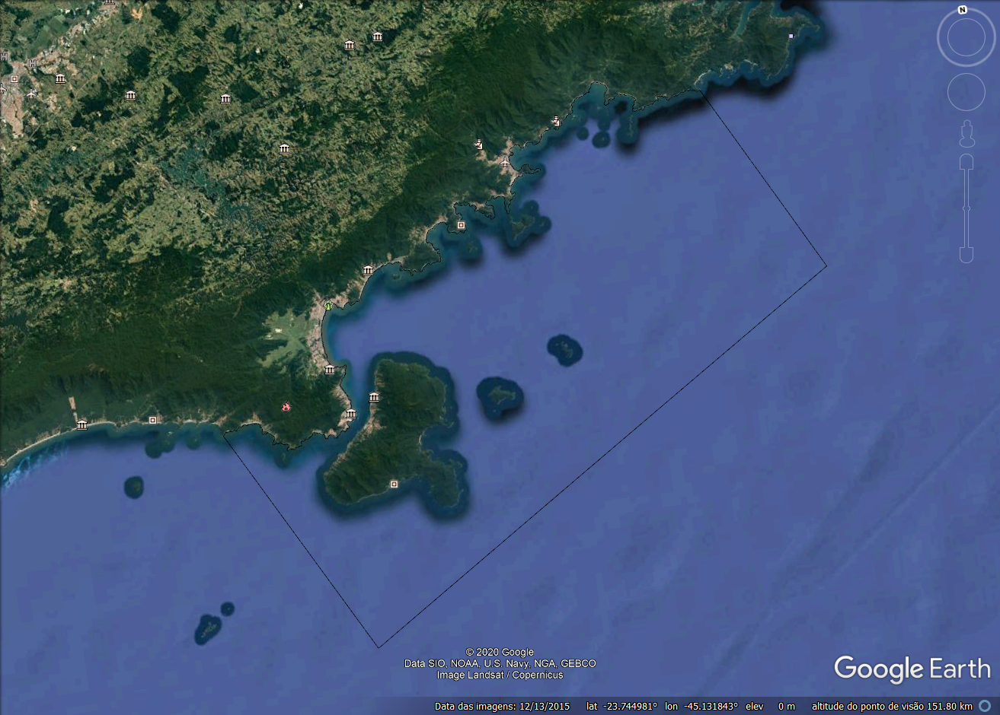



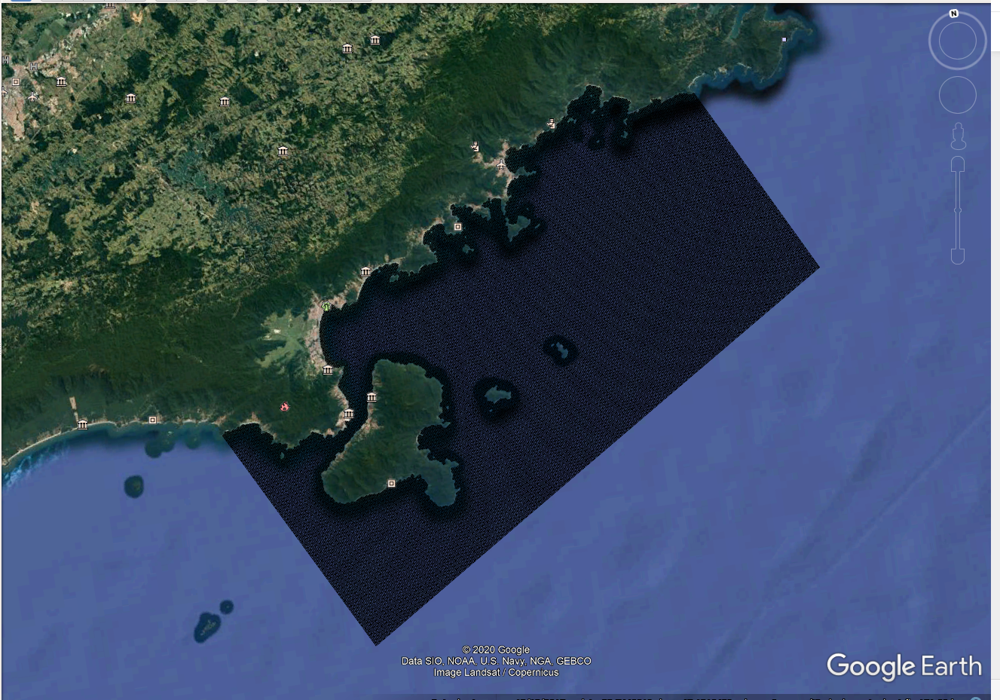

A grade contem elementos uniformemente distribuidos em dimensões horizontais. Cada célula é de aproximadamente 50 x 50 m de largura. 

Para a discretização vertical, foram utilizadas 8 camadas SIGMA, visto que na região, conforme a literatura, há presença marcada de termoclina no verão devido à intrusão da ACAS. Além disso, há variação nas profundidades de 60 - 0 m, sendo assim, o sistema de coordenadas sigma verticais é o mais adequado para representar essa variação no domínio.

# Forçantes utilizadas

O Modelo utilziado foi o Delft3D em seu modulo hidrodinâmico.

Os parametros considerados foram:

- Vento
- Temperatura
- Salinidade

Foi utilizada a biblioteca Delft Dashboard para gerar as fronteiras abertas e as constantes harmônicas do TPXO 8.0. Segue imagem das fronteiras:

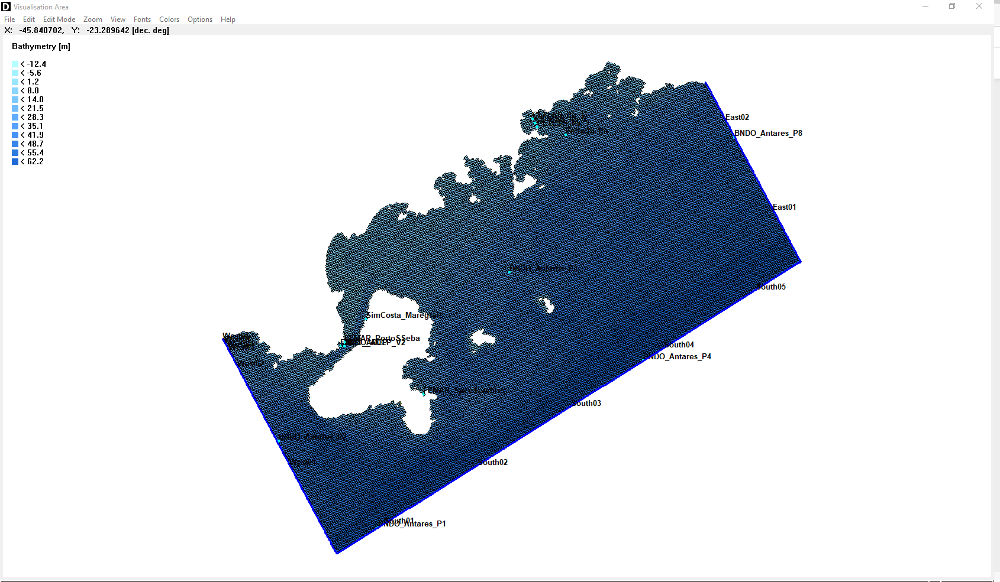



Sendo assim, 6 fronteiras a Oeste, 5 fronteiras a Sul e 2 fronteiras a Leste.

Em cada um dos domínios abertos, além das constantes harmonicas, foram adicionados os dados disponíveis no sistemas de modelo HYCOM. Pela disponibilidade de nível e corrente, foram utilizadas bordas Riemann, que são bordas não reflexivas, que consideram propagam snal de velocidade, levando em conta as variações do nível e a batimetria local:



Cada borda então conta com:

- Componente U HYCOM 3D: Bordas Oeste e Leste. Foi adicionada a coomponente NORMAL a borda, sendo assim, há perda de intensidade da componente original
- Componente V HYCOM 3D: Borda Sul. Foi adicionada a coomponente NORMAL a borda, sendo assim, há perda de intensidade da componente original
- Nível Hycom + Maré Reconstruída TPXO 8.0
- Temperatura 3D HYCOM
- Salinidade 3D HYCOM

Devido a extensão do domínio, ao longo dos testes, verificou-se que apenas a inclusão de forçantes oceanográficas não era o suficiente. Para complementar, foi acionada a troca de calor no modelo, utilzando as equações referentes ao modo "ocean". Para implementação deste sistema, foi preciso:

- Temperatura do Ar 
- Humidade Relativa
- % Cobertura de Nuvens
- Radiação de Onda Curta Incidente

Felizmente, todas as variáveis descritas estão disponíveis no sistema de reanálises CFSR. Desta maneira foram utilizadas tais componentes, além do vento e pressão. Todos mapeados ao longo do domínio do modelo.

# Périodo Escolhido

As forçantes, por serem de outros modelos, não são uma restrição para escolha do período de modelagem, no entanto a ausencia de dados sim. Segue imagem de todas as informações fornecidas pelo BNDO:

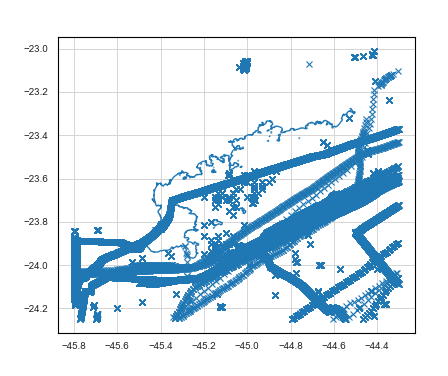

Mesmo com uma infinidade de dados do BNDO, apenas um conjunto foi longevo suficiente para análise. Os dados utilizados, são referentes a uma coleta de janeiro de 2014 até final de maio de 2014, na baía do Araçá. 

O conjunto de dados apresenta:

- ADCP: velocidade única para coluna da água
- CTD :Temperatura e Salinidade em 2 profundidades

Assim, como a análise de constantes harmônicas não é um limitante, decidiu-se para calibração rodar de: 01/01/2014 até 01/06/2014. Compreendendo assim parte do verão e outono.



# Bibliotecas e Constantes utilizadas para Análise

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from datetime import timedelta

from TTutils.Delft3D import *
from TTutils.MO import *
from TTutils import Calibration

import matplotlib.pyplot as plt
import matplotlib.dates as mp_dates

import seaborn as sns

sns.set_style('whitegrid')

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#Correção de Tempo. CSFT está sempre em UTC
hours = 3
tref = '01-01-2014'
tref_file = '2014-01-01'

uba = gpd.read_file('d:\WORK\PROCAM\Dissertacao\GIS\Linha_de_Costa\LC.shp')
sp = gpd.read_file('d:/WORK/PROCAM/Dissertacao/GIS/Shapes_base/SP_Municipios_2019.shp')

%matplotlib notebook

# Funções Utilizadas

In [2]:
def corr_UTC(ds):
    
    time = pd.to_datetime(ds.time.values)
    time = time - timedelta(hours=hours)    
    
    ds['time'] = time
    
    return ds

def sel_period_cal(ds):
    
    ds = ds.where((wnd['time.year']==2014) & (ds['time.month']<6),drop=True)
    
    return(ds)

def stickplot(T,intervalo,inicio,fim,u,v,vel,margem=5,cmap=plt.cm.YlGnBu,title='',figure_name=''):
    '''
    Faz a figura de stickplot
    
    D = array/dataframe com o eixo de tempo
    intervalo = intervalo de tempo (na mesma unidade do eixo de tempo) que deseja que as setas do stickplot sejam plotadas
    inicio/fim = 0 e -1 se quiser plotar o período completo
                         = tempo em horas de início e fim que deseja cortar o período
    cmap = escala de cor desejada
    title = string com o título do gráfico
    figure_name = string com o nome desejado para o arquivo de saída
    margem = valor em horas que representa o espaço em branco no início e fim da figura para que todas as setas apareçam
    
    '''
    
    data_inicio = pd.Timestamp(T.year[inicio], T.month[inicio], T.day[inicio], T.hour[inicio]) - timedelta(hours=margem)
    data_fim = pd.Timestamp(df.index.year[fim], df.index.month[fim], df.index.day[fim], df.index.hour[fim]) + timedelta(hours=margem)
    
    maximo = vel[0:-1].max()

    fig = plt.figure(figsize=(30,10))
    ax = fig.add_subplot(1, 1, 1)
    cvmap = cmap
        
    pq  = plt.quiver(T[inicio:fim:intervalo],np.zeros(len(T))[inicio:fim:intervalo],u[inicio:fim:intervalo],v[inicio:fim:intervalo],vel[inicio:fim:intervalo],
                         cmap = cvmap,width = 0.004,headaxislength = 3,angles = 'uv',scale_units = 'y',scale = 2.5)
    plt.plot(pd.date_range(start=data_inicio, end=data_fim,freq='H'),np.zeros(len(pd.date_range(start=data_inicio, end=data_fim,freq='H'))),'--',color = 'black',linewidth = 1)
    plt.grid(color='lightgray', linestyle='--', linewidth=0.8)
        
    # Formata os eixos da figura
  
    plt.axis([data_inicio,data_fim,-maximo-0.01,maximo+0.01])
    ax.xaxis.set_major_formatter(mp_dates.DateFormatter('%d/%m %H:%M (UTC)'))
    ax.yaxis.set_major_formatter(plt.NullFormatter())
    #ax.set_ylim(-5,5)
    fig.autofmt_xdate()
        
    plt.title(title + '\n',fontsize = 35,weight = 'bold')
        
    # Formata colobar
    cbar = plt.colorbar(pq,cmap = cvmap)
    plt.clim(0, np.ceil(maximo))
    cbar.ax.set_ylabel('Intensidade (m/s)',rotation = 270,labelpad = +40)
        
    #figname=arq.replace('.obs.p01.log','.png')
    #plt.savefig(figure_name + figname, bbox_inches='tight',dpi = 200)
    #plt.close('all')
    
def godin(wl):
    
    a = wl.rolling(24,center=True).mean()
    b = a.rolling(24,center=True).mean()
    c = b.rolling(25,center=True).mean()    
    c = c.squeeze()
    
    wl['Elev_Geostrof'] = c.values
    wl['Elev_Astro'] = wl['water level (m)'] - c.values
    
    return wl

def passa_baixa(sig,interval):
    
    a = sig.rolling(interval,center=True).mean()   
       
    return a


    

# Dados do CFSR

In [3]:
#CFSR

wnd = xr.open_dataset('../Forcantes/CFSR/cfsr_wnd10m_2014_2020.nc')

if wnd.lon.values[0] > 180:
    wnd['lon'] = wnd.lon - 360
wnd = corr_UTC(wnd)
wnd = sel_period_cal(wnd)
wnd['vel'] = ((wnd['U_GRD_L103'])**2 + (wnd['V_GRD_L103'])**2)**0.5

pres = xr.open_dataset('../Forcantes/CFSR/cfsr_prmsl_2014_2020.nc') 
if pres.lon.values[0] > 180:
    pres['lon'] = pres.lon - 360
pres = corr_UTC(pres)
pres = sel_period_cal(pres)

    
hum = xr.open_dataset('../Forcantes/CFSR/cfsr_rlhum_2014_2020.nc')   
if hum.lon.values[0] > 180:
    hum['lon'] = hum.lon - 360
hum = corr_UTC(hum)
hum = sel_period_cal(hum)

    
cloud = xr.open_dataset('../Forcantes/CFSR/cfsr_cldcovtot_2014_2020.nc')
if cloud.lon.values[0] > 180:
    cloud['lon'] = cloud.lon - 360
cloud = corr_UTC(cloud)
cloud = sel_period_cal(cloud)


temp_ar = xr.open_dataset('../Forcantes/CFSR/cfsr_tmpsfc_2014_2020.nc')   
if temp_ar.lon.values[0] > 180:
    temp_ar['lon'] = temp_ar.lon - 360

#Convertendo de Kelvin para Celsius
temp_ar['Celsius'] = temp_ar.TMP_L1 - 273.15
temp_ar = corr_UTC(temp_ar)
temp_ar = sel_period_cal(temp_ar)

rad = xr.open_dataset('../Forcantes/CFSR/cfsr_dswsfc_2014_2020.nc')
#coordenadas    
if rad.lon.values[0] > 180:
    rad['lon'] = rad.lon - 360
rad = corr_UTC(rad)
rad = sel_period_cal(rad)



# Domínio do CFSR

Nota-se que o dominio atmosférico é tem uma amplitude maior do que a área a ser considerada para a modelagem.

<IPython.core.display.Javascript object>


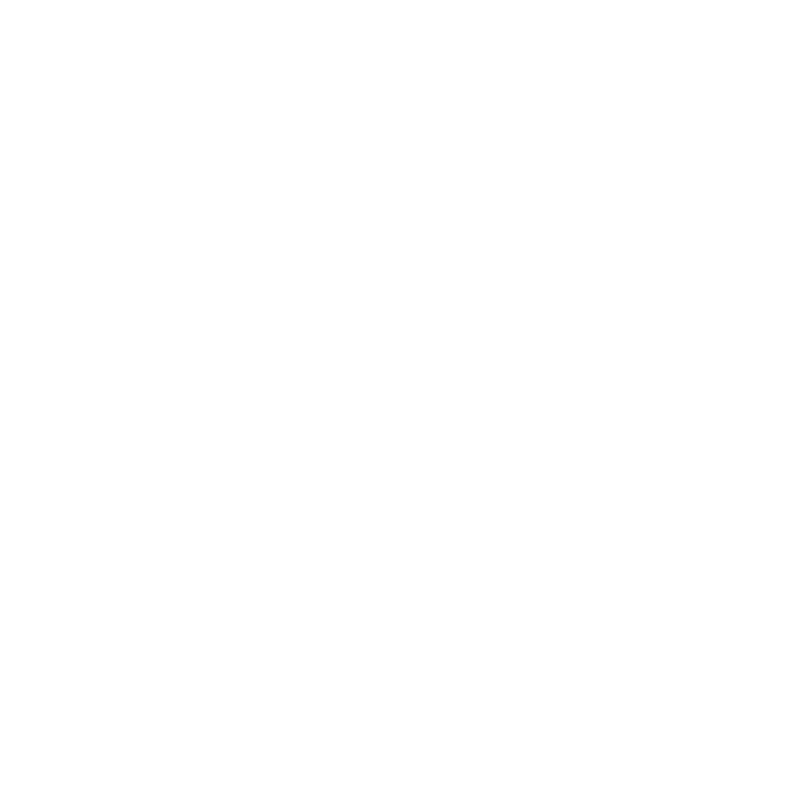

<IPython.core.display.Javascript object>


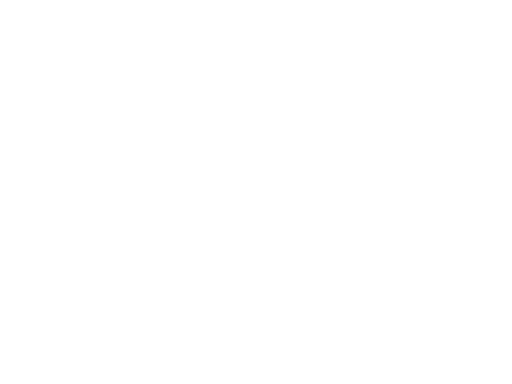

In [4]:
plt.figure(figsize = (10,10))
ax = uba.plot(color='k') 
wnd.isel(time=0).vel.plot(ax=ax)

# Reconstruções FEMAR 2014

Para a validação de maré, foi utilizada apenas a estação do Porto de São Sebastião, com localização apresentada na figura a seguir:

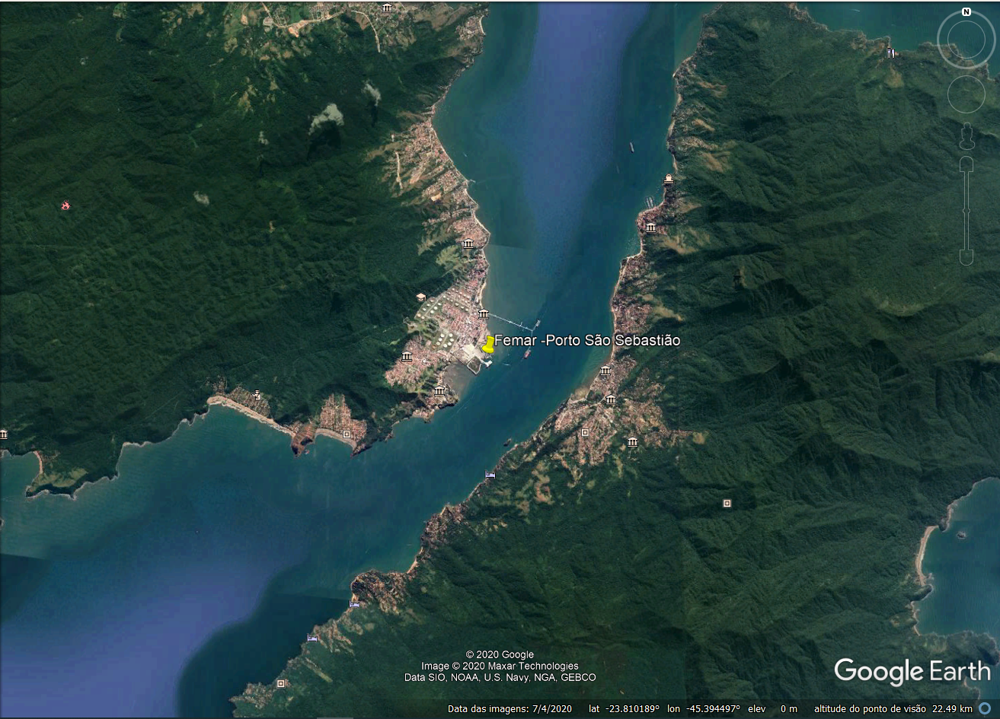

In [5]:
#femar Porto de São Sebastião
fm_232 = pd.read_excel('../../dados/FEMAR/232_2014.xlsx',index_col=0,parse_dates=True)
fm_232['Amp_not_mean'] = (fm_232.Amplitude - fm_232.Amplitude.mean())/100


#femar Saco do Sombrio - Essa aqui não ficou boa
fm_231 = pd.read_excel('../../dados/FEMAR/231_2014.xlsx',index_col=0,parse_dates=True)
fm_231['Amp_not_mean'] = (fm_231.Amplitude - fm_231.Amplitude.mean())/100

# Validação Maré Astrômica FEMAR São Sebastião

<IPython.core.display.Javascript object>


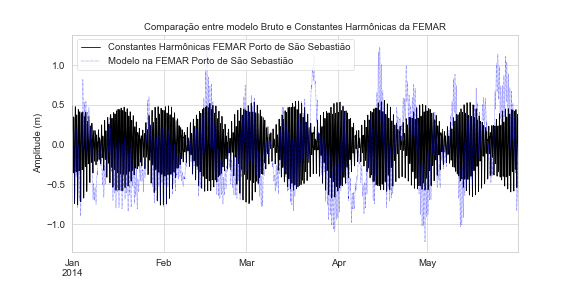

<IPython.core.display.Javascript object>


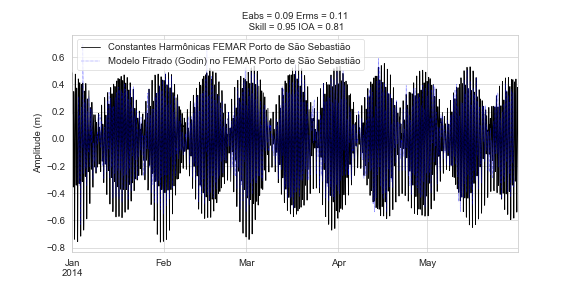

RMAE=Excelente


In [36]:
#modelo
WL_SSeba = pd.read_csv('Rc_final/RC_BAROC2_FEMAR_PortoSSeba_WL.csv',index_col=0,parse_dates=True)
WL_SSeba.index = WL_SSeba.index - pd.Timedelta(hours=3)
WL_SSeba = godin(WL_SSeba)


#Modelo Bruto Verus Nível
plt.figure(figsize=(10,5))

fm_232.Amp_not_mean.plot(color='k',linewidth=1,label='Constantes Harmônicas FEMAR Porto de São Sebastião')
WL_SSeba['water level (m)'].plot(color='b',linewidth=0.6,linestyle=':',label='Modelo na FEMAR Porto de São Sebastião')

plt.ylabel('Amplitude (m)')
plt.title('Comparação entre modelo Bruto e Constantes Harmônicas da FEMAR')

plt.xlabel('')
plt.legend()
plt.show()

plt.savefig('figuras/Valid_BRUTO_Femar_SSeba.png',dpi=300,bbox='tight')


#Validação de Nível
plt.figure(figsize=(10,5))

fm_232.Amp_not_mean.plot(color='k',linewidth=1,label='Constantes Harmônicas FEMAR Porto de São Sebastião')
WL_SSeba.Elev_Astro.plot(color='b',linewidth=0.6,linestyle=':',label='Modelo Fitrado (Godin) no FEMAR Porto de São Sebastião')


data_rec = fm_232.reindex(WL_SSeba.index)

stat = Calibration.Statistics(WL_SSeba.Elev_Astro,data_rec.Amp_not_mean)


plt.ylabel('Amplitude (m)')
# plt.title('Eabs = {} Erms = {} RMAE = {}\n Skill = {} IOA = {} R2 = {}'.format(np.round(stat['Eabs'],2),np.round(stat['Erms'],2),np.round(stat['RMAE'],2),
#                                                                                np.round(stat['Skill'],2),np.round(stat['IOA'],2),np.round(stat['R2'],2)))
plt.title('Eabs = {} Erms = {}\n Skill = {} IOA = {}'.format(np.round(stat['Eabs'],2),np.round(stat['Erms'],2),
                                                                               np.round(stat['Skill'],2),np.round(stat['IOA'],2)))

plt.xlabel('')
plt.legend()
plt.show()

plt.savefig('figuras/Valid_Femar_SSeba.png',dpi=300,bbox='tight')




# Espectros de Frequência Constantes da FEMAR

<IPython.core.display.Javascript object>


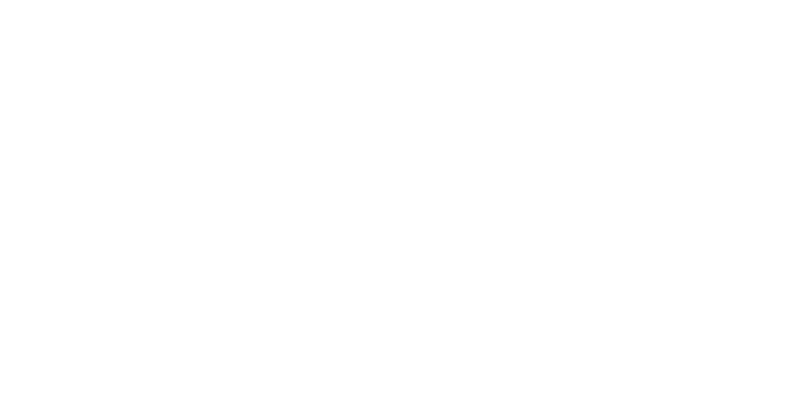

In [7]:
#Espectro de Frequências

dt = 1  # sampling interval
Fs = 24 / dt  # sampling frequency

WL_SSeba.dropna(inplace=True)

plt.figure(figsize=(10,5))
plt.magnitude_spectrum(fm_232.Amp_not_mean, Fs=Fs)
plt.title('Espectro de Frequências das Constantes Harmônicas FEMAR Porto de São Sebastião')
plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.xlim(0,5)

plt.savefig('figuras/Espec_Femar_SSeba.png',dpi=300,bbox='tight')


# Espectros de Frequência Nível Total do Modelo

<IPython.core.display.Javascript object>


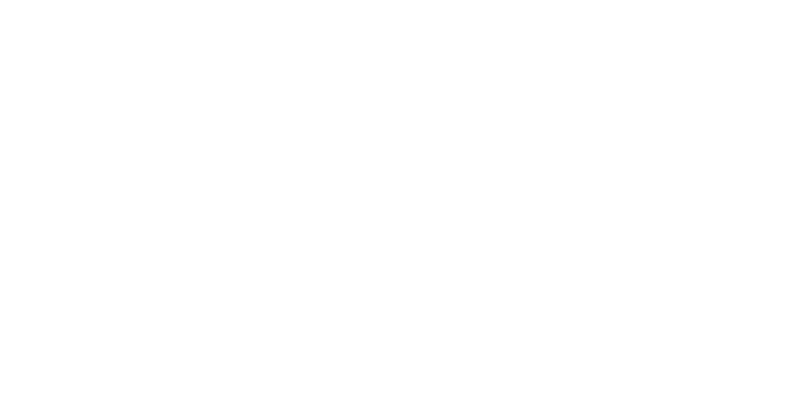

In [8]:
plt.figure(figsize=(10,5))
plt.magnitude_spectrum(WL_SSeba['water level (m)'], Fs=Fs)
plt.title('Espectro de Frequências do Nível Total do Modelo, nas imediações da FEMAR Porto de São Sebastião')
plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.xlim(0,5)

plt.savefig('figuras/Espec_MOD_TOT_Femar_SSeba.png',dpi=300,bbox='tight')

# Espectros de Frequência Nível Total do Modelo + FEMAR

<IPython.core.display.Javascript object>


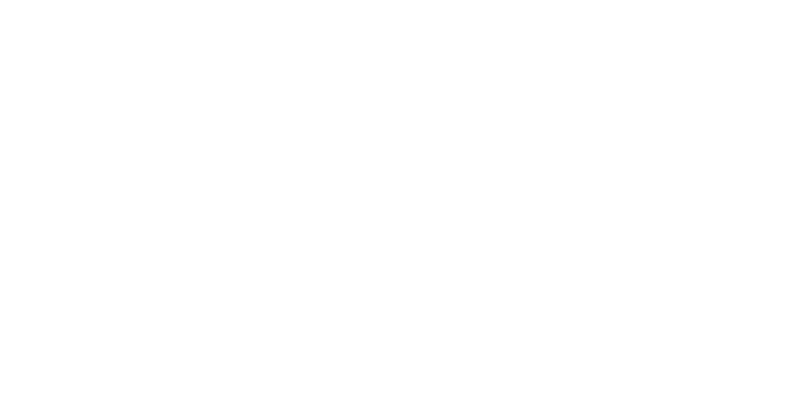

In [9]:
WL_SSeba.dropna(inplace=True)

plt.figure(figsize=(10,5))
plt.magnitude_spectrum(fm_232.Amp_not_mean, Fs=Fs,color='k',linewidth=1,label='FEMAR')
plt.magnitude_spectrum(WL_SSeba['water level (m)'], Fs=Fs,color='b',linewidth=1,linestyle=':',label='Modelo')

plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.legend()

plt.xlim(0,5)

plt.savefig('figuras/Espec_Femar_e_Modelo_BTUTO_SSeba.png',dpi=300,bbox='tight')


# Espectros de Frequência Nível Astronômico

<IPython.core.display.Javascript object>


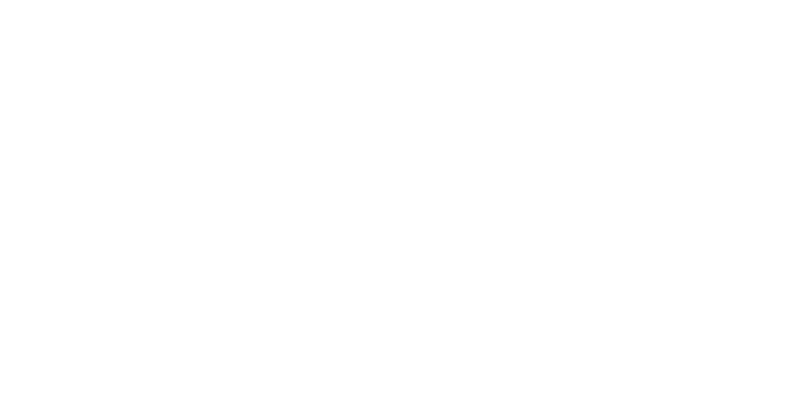

In [10]:
plt.figure(figsize=(10,5))
plt.magnitude_spectrum(WL_SSeba.Elev_Astro, Fs=Fs)
plt.title('Espectro de Frequências do Nível Astronômico do Modelo, nas imediações da FEMAR Porto de São Sebastião')
plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.xlim(0,5)

plt.savefig('figuras/Espec_MOD_ASTRO_Femar_SSeba.png',dpi=300,bbox='tight')


# Espectros de Frequência Nível Astronômico + FEMAR

<IPython.core.display.Javascript object>


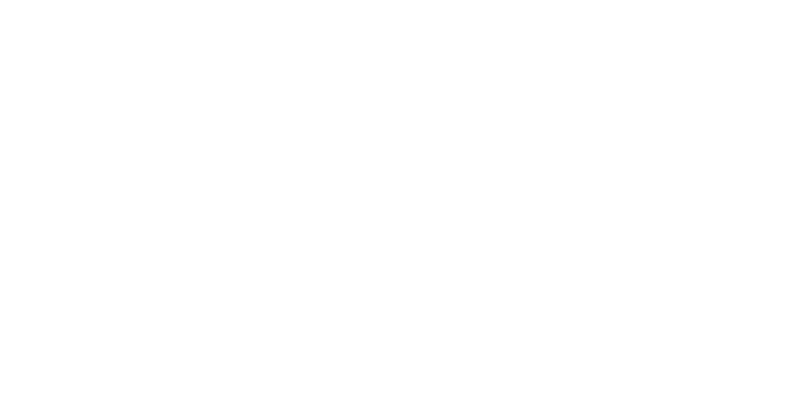

In [11]:
plt.figure(figsize=(10,5))

plt.magnitude_spectrum(fm_232.Amp_not_mean,  Fs=Fs,color='k',linewidth=1,label='FEMAR')

plt.magnitude_spectrum(WL_SSeba.Elev_Astro, Fs=Fs,color='b',linewidth=1,linestyle=':',label='Modelo')

plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.xlim(0,5)

plt.legend()

plt.savefig('figuras/Espec_Femar_e_Modelo_GODIN_SSeba.png',dpi=300,bbox='tight')

# Espectros de Frequência Nível Geostrófico

<IPython.core.display.Javascript object>


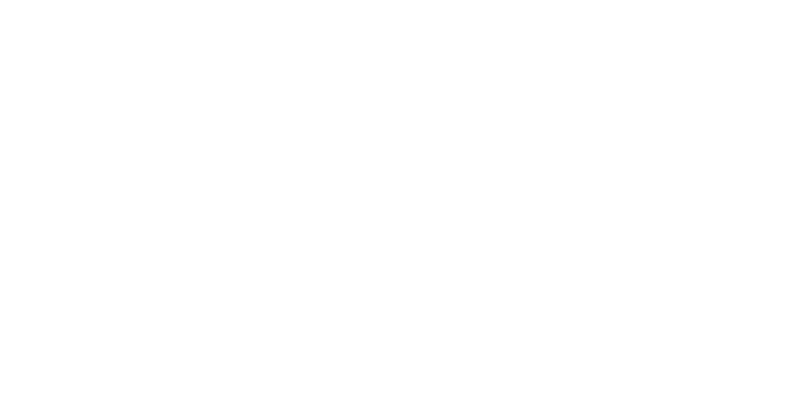

In [12]:
plt.figure(figsize=(10,5))
plt.magnitude_spectrum(WL_SSeba.Elev_Geostrof, Fs=Fs)
plt.title('Espectro de Frequências do Nível Geostrófico do Modelo, nas imediações da FEMAR Porto de São Sebastião')
plt.ylabel('Amplitude (m)')
plt.xlabel('Ciclos por Dia')

plt.savefig('figuras/Espec_MOD_GEOS_Femar_SSeba.png',dpi=300,bbox='tight')

# Considerações sobre os Espectros

Fica claro que no ponto onde foi obtido o nível total, a elevação tem forte sinal marcado em uma baixa frequência. Isto é comprovado ao passar o Filtro de Godin, pois então, o espectro de amplitude fica muito similar ao que é visto nas constantes harmônicas da FEMAR.

# CORRENTE - DADOS DO BNDO: VELLIGER 2014 - CAMPANHA BIOTA

Conforme dito anteriormente, havia apenas uma série longa disponível para validação pontual de correntes. Segue imagem da localização do dado, coletado de 13/01/2014 - 31/05/2014

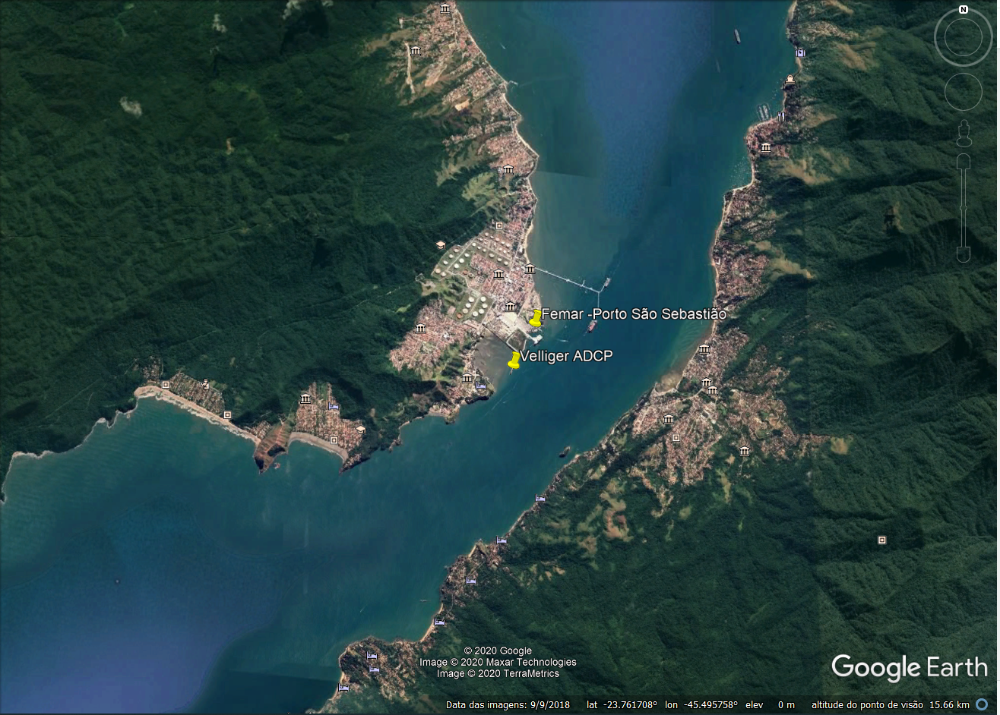

In [13]:
#Dados Totais do ADCP
bndo_adcp = pd.read_csv('dados/BNDO_veliger_2014.csv')

C:\Users\Desktop\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Desktop\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<IPython.core.display.Javascript object>


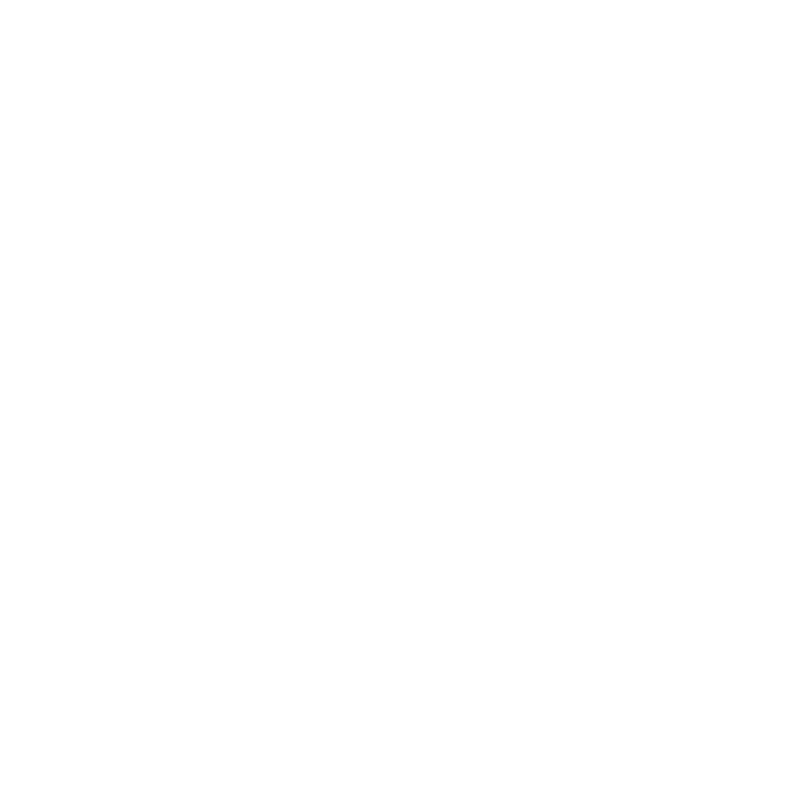

Text(0.5, 1.0, 'Componente V')

In [14]:
#DADOS DE CORRENTE
vel_bndo = bndo_adcp[bndo_adcp['Velocidade de Corrente [cm/s]'] != 'None']
vel_bndo.index = pd.to_datetime(vel_bndo['Data-Hora'])

vel_bndo['u'] = (vel_bndo['Velocidade de Corrente [cm/s]'].astype(float) * 
                 np.sin(np.deg2rad(vel_bndo['Direção de Corrente [Graus]'].astype(float))))/100
vel_bndo['v'] = (vel_bndo['Velocidade de Corrente [cm/s]'].astype(float) *
                 np.cos(np.deg2rad(vel_bndo['Direção de Corrente [Graus]'].astype(float))))/100

#FIGURA DE COMPONENTES
ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)

vel_bndo.u.plot(ax=ax[1][0])
vel_bndo.v.plot(ax=ax[1][1])

ax[1][0].set_ylabel('Corrente (m/s)')
ax[1][1].set_ylabel('Corrente (m/s)')

ax[1][0].set_title('Componente U')
ax[1][1].set_title('Componente V')


# TEMPERATURA E SALINIDADE - DADOS DO BNDO: VELLIGER 2014 - CAMPANHA BIOTA

<IPython.core.display.Javascript object>


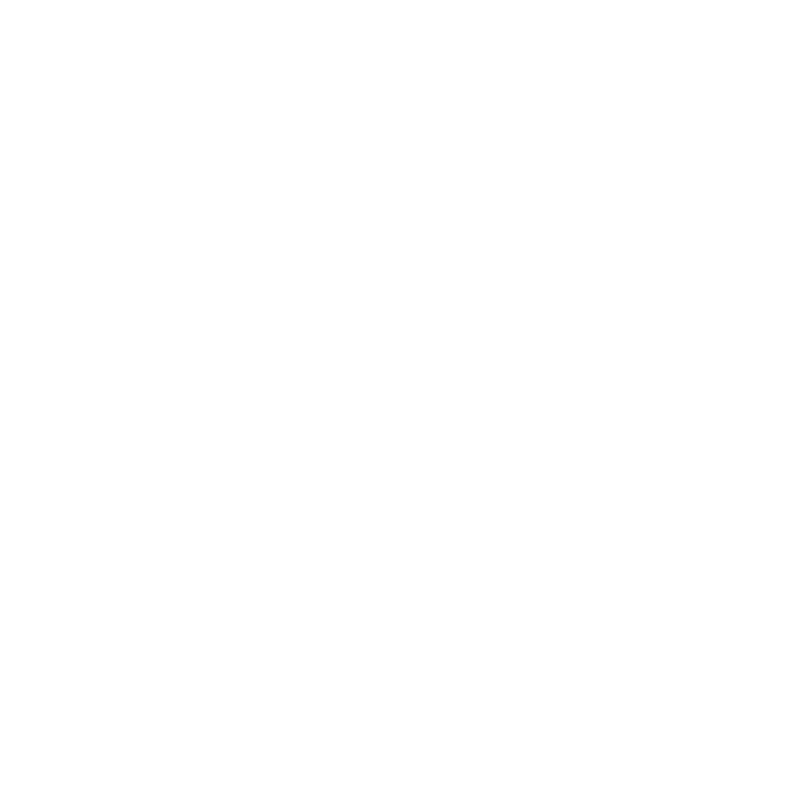

In [15]:
#DADOS DE TEMPERATURA E SALINIDADE
tt  = bndo_adcp[bndo_adcp['Temperatura [°C]'] != 'None']
tt.index = pd.to_datetime(tt['Data-Hora'])

ss  = bndo_adcp[bndo_adcp['Salinidade [PSU]'] != 'None']
ss.index = pd.to_datetime(ss['Data-Hora'])

t0 = tt[tt['Profundidade [m]'] ==0]['Temperatura [°C]'].astype(float)
t1 = tt[tt['Profundidade [m]'] !=0]['Temperatura [°C]'].astype(float)

s0 = ss[ss['Profundidade [m]'] ==0]['Salinidade [PSU]'].astype(float)
s1 = ss[ss['Profundidade [m]'] !=0]['Salinidade [PSU]'].astype(float)


#FIGURA DE TS
ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)

t0.plot(ax=ax[1][0],label= 'Superfície')
t1.plot(ax=ax[1][0],label ='Profundidade variável')

s0.plot(ax=ax[1][1],label= 'Superfície')
s1.plot(ax=ax[1][1],label ='Profundidade variável')

ax[1][0].set_ylabel('Temperatura (°C)')
ax[1][1].set_ylabel('Salinidade (PSU)')

ax[1][0].set_title('Temperatura')
ax[1][1].set_title('Salinidade')

plt.legend()

# Considerações sobre o Dado

Fica claro que no inicio da coleta há alguma inconsistência na coleta, tanto para corrente, quanto para temperatura e salinidade. 

A partir do dia 11/02/2014, os dados ficam mais consistentes. Portanto para a validação feita a seguir, serão utilizados os dados apenas a partir desta data

In [16]:
vel_bndo = vel_bndo.loc['2014-02-11'::]
tt = tt.loc['2014-02-11'::]
ss = ss.loc['2014-02-11'::]

# Validação

# Resultados do Modelo no Ponto do ADCP

O modelo foi feito com 8 camadas SIGMA para tentar representar o melhor possível as estruturas termohalinas, assim sendo estratificado no verão e homogeneo no inverno.

In [17]:
bndo_mod_adcp = pd.read_csv('Rc_final/RC_BAROC2_BNDO_ACDP2_VEL.csv')
bndo_mod_adcp.index = pd.to_datetime(bndo_mod_adcp.iloc[:,0])

bndo_mod_adcp = bndo_mod_adcp.reindex(vel_bndo.index).interpolate()

# Correntes Por Camada

O modelo consegue repreduzir bem o que é observado no dado, acompanhando as variações de maior período observado nos dados. Dentre as camadas, a superficial é a que melhor representa. Após esas figuras, será analisar apenas ela.

<IPython.core.display.Javascript object>


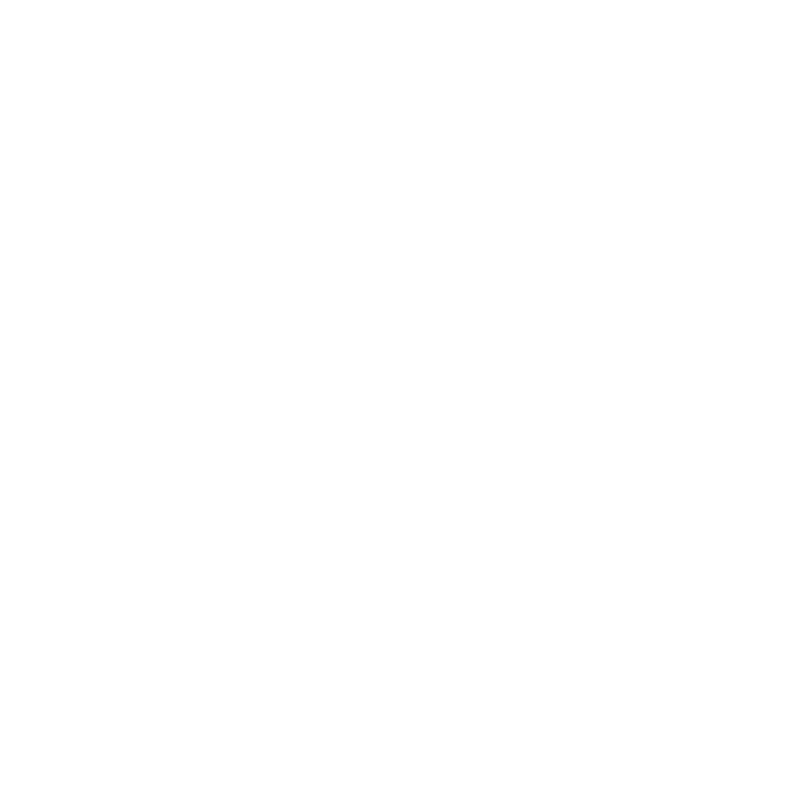

CAMADA SIGMA 1
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


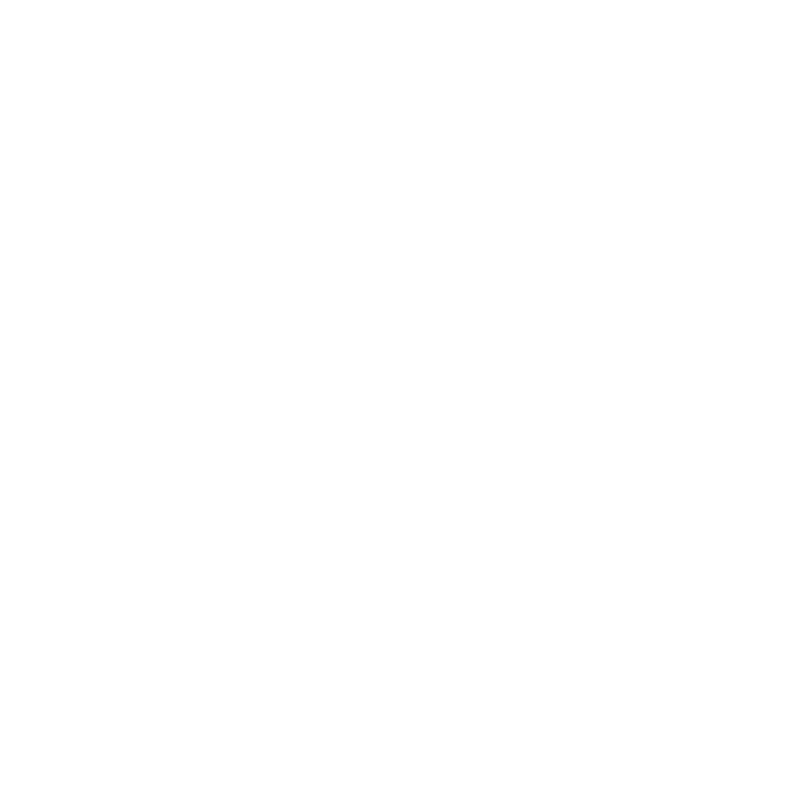

CAMADA SIGMA 2
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


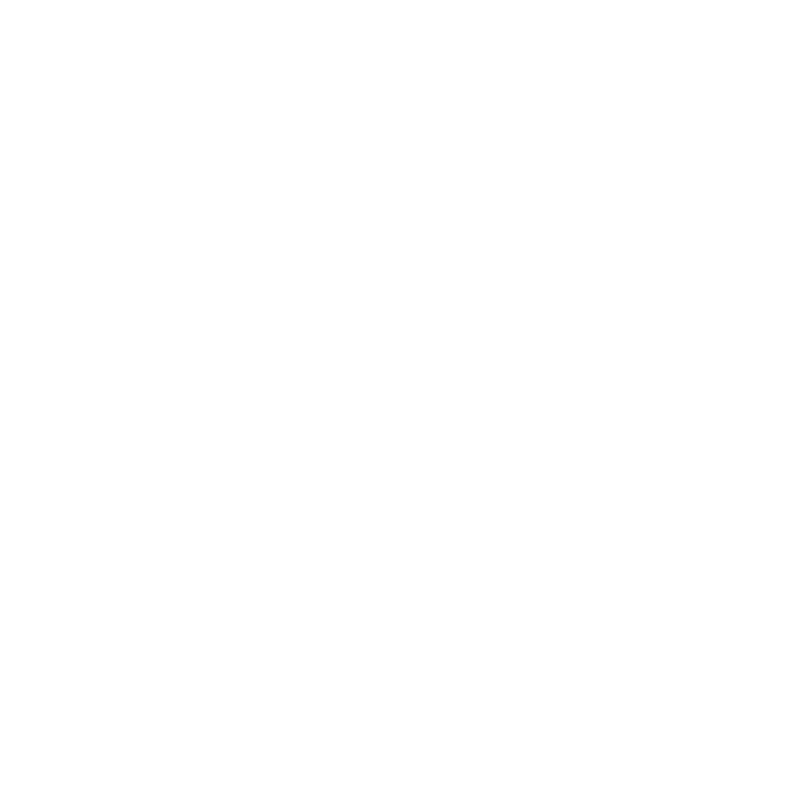

CAMADA SIGMA 3
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


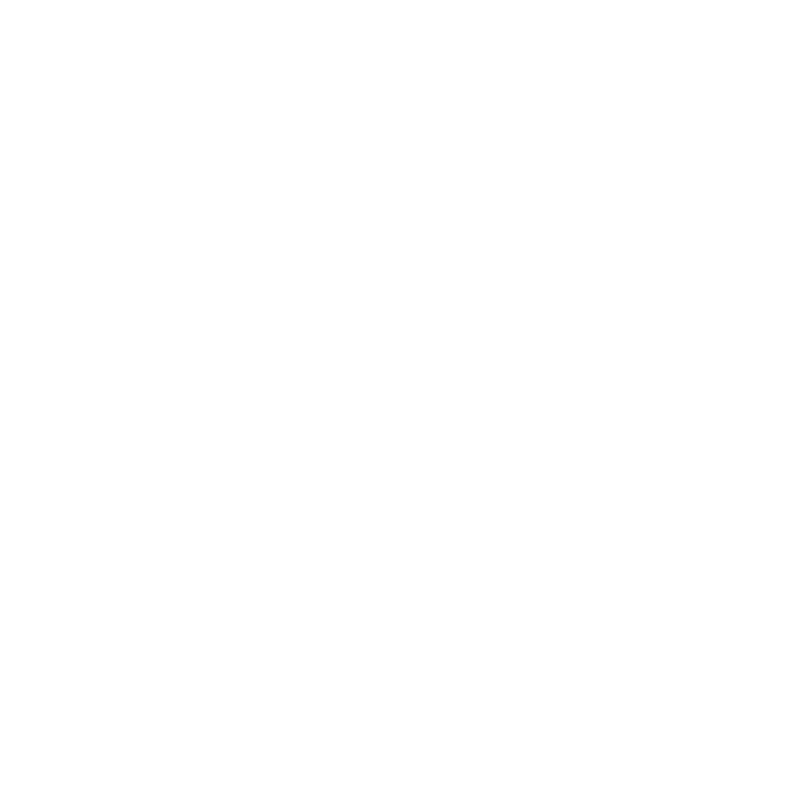

CAMADA SIGMA 4
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


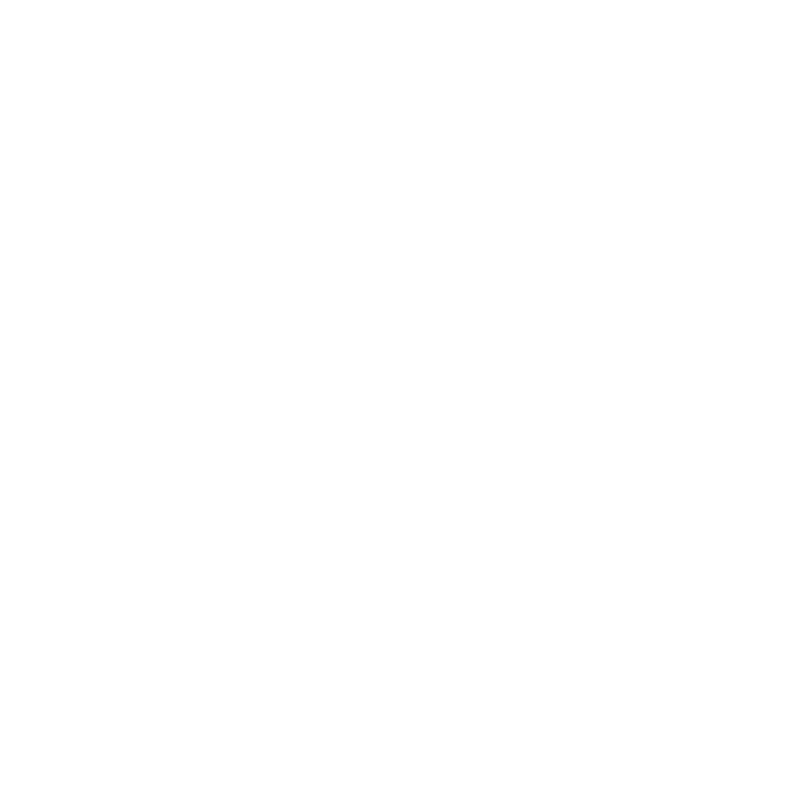

CAMADA SIGMA 5
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


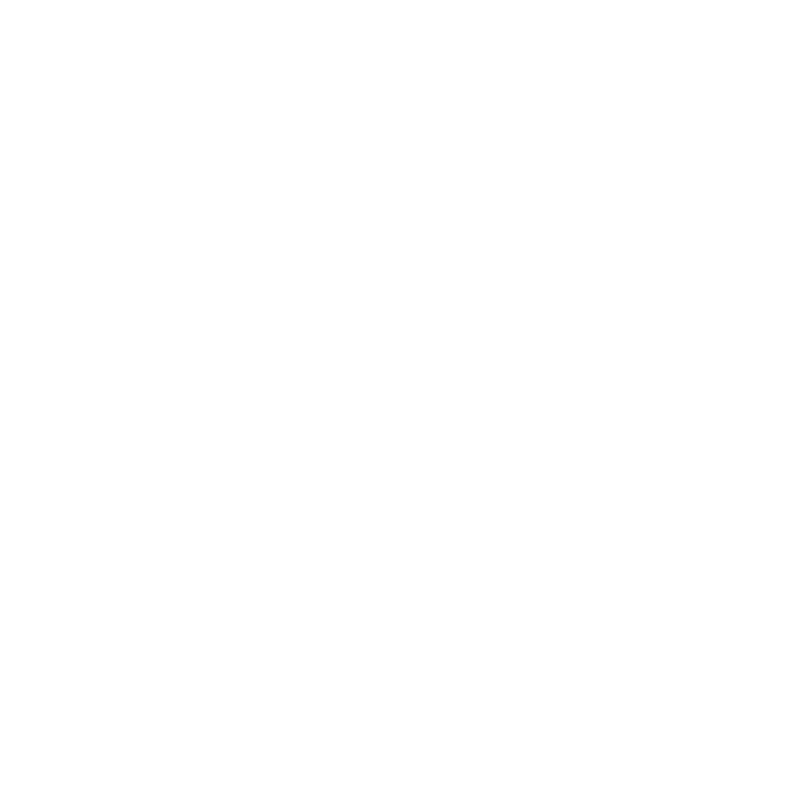

CAMADA SIGMA 6
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


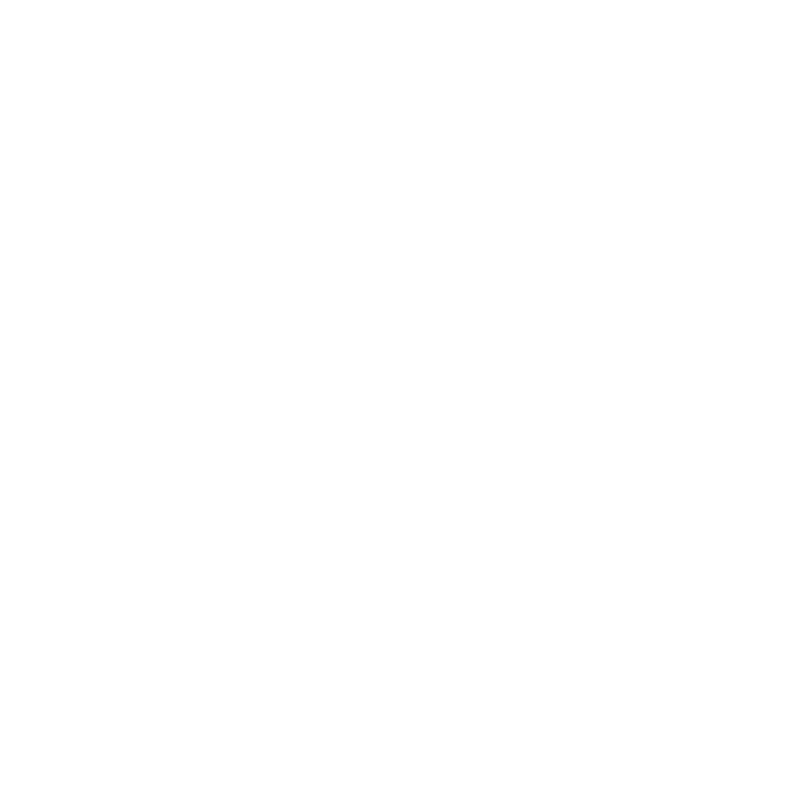

CAMADA SIGMA 7
RMAE=Excelente
RMAE=Excelente


<IPython.core.display.Javascript object>


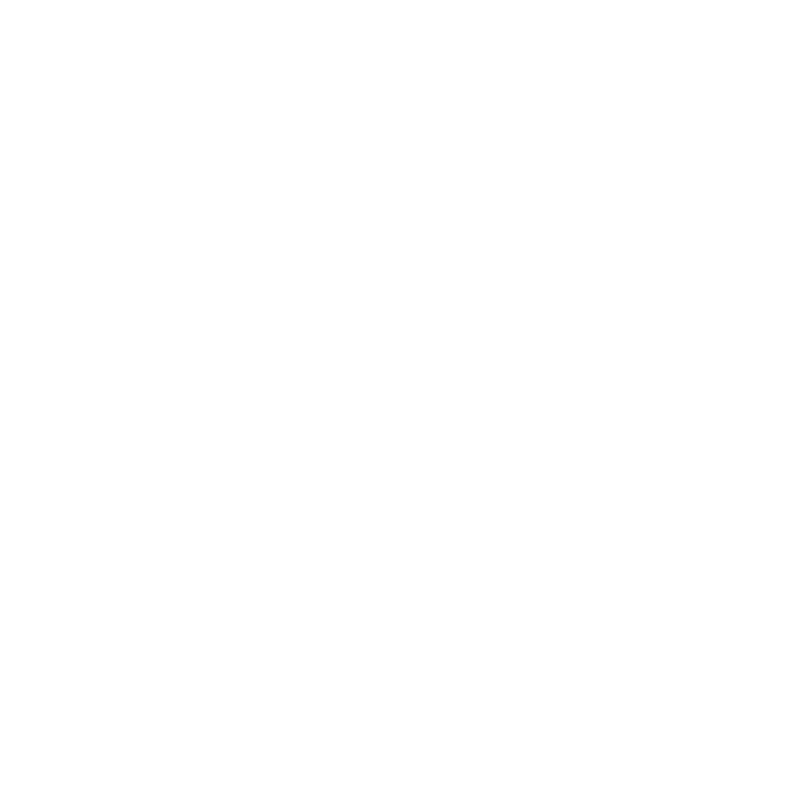

CAMADA SIGMA 8
RMAE=Excelente
RMAE=Excelente


In [18]:
#FIGURA DE COMPONENTES

for layer in range(1,9):
    
    ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)
    
    print('CAMADA SIGMA {}'.format(layer))
    
    u = bndo_mod_adcp.iloc[:,(layer*2)-1]
    v = bndo_mod_adcp.iloc[:,layer*2]
    
    vel_bndo.u.plot(ax=ax[1][0],label='Dado')
    vel_bndo.v.plot(ax=ax[1][1],label='Dado')
    
    u.plot(ax=ax[1][0],label = 'Modelo', linestyle=':')
    v.plot(ax=ax[1][1],label = 'Modelo', linestyle=':')  
    
    
    stat_u = Calibration.Statistics(u,vel_bndo.u)
    stat_v = Calibration.Statistics(v,vel_bndo.v)

    ax[1][0].set_ylabel('Corrente (m/s)')
    ax[1][1].set_ylabel('Corrente (m/s)')

    ax[1][0].set_title('Componente U\nEabs = {} Erms = {} RMAE = {}\n Skill = {} IOA = {} R2 = {}'.format(np.round(stat_u['Eabs'],2),np.round(stat_u['Erms'],2),np.round(stat_u['RMAE'],2),
                                                                               np.round(stat_u['Skill'],2),np.round(stat_u['IOA'],2),np.round(stat_u['R2'],2)))
    ax[1][1].set_title('Componente V\nEabs = {} Erms = {} RMAE = {}\n Skill = {} IOA = {} R2 = {}'.format(np.round(stat_v['Eabs'],2),np.round(stat_v['Erms'],2),np.round(stat_v['RMAE'],2),
                                                                               np.round(stat_v['Skill'],2),np.round(stat_v['IOA'],2),np.round(stat_v['R2'],2)))
    
    plt.legend()


# Corrente Superficial - Modelo Passa Baixa 16 h

Uma leve filtragem aprimora a validação. O dado não aaparenta ter marcado a componente de maré que é visivel nos resultados do modelo.

Fica Claro nessa figura que há dois períodos distitnos registrados. Até aproximadamente dia 20/03, a maior variância no sinal da corrente é observada na Componente V. Porém, a partir desta data, este efeito passa a ser visto na Componente U.

Muito provavelmente correlacionado com o padrão de ventos.

<IPython.core.display.Javascript object>


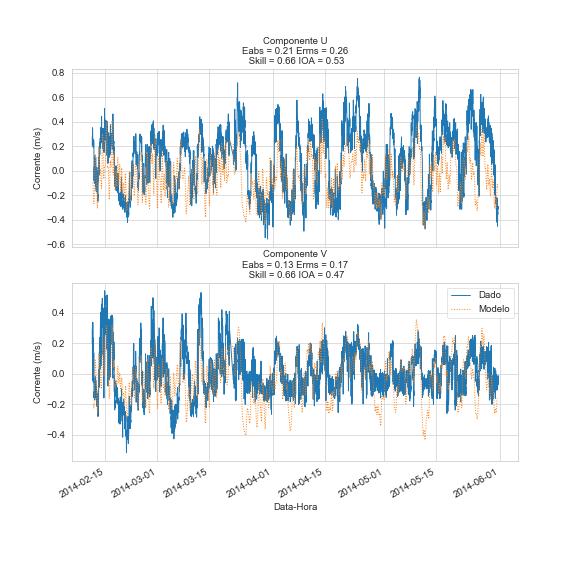

CAMADA SIGMA 8
RMAE=Excelente
RMAE=Excelente


In [38]:
ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)
    
print('CAMADA SIGMA {}'.format(layer))

u = bndo_mod_adcp.iloc[:,1]
v = bndo_mod_adcp.iloc[:,2]

u = passa_baixa(u,16)
v = passa_baixa(u,16)

vel_bndo.u.plot(ax=ax[1][0],label='Dado')
vel_bndo.v.plot(ax=ax[1][1],label='Dado')

u.plot(ax=ax[1][0],label = 'Modelo', linestyle=':')
v.plot(ax=ax[1][1],label = 'Modelo', linestyle=':') 


stat_u = Calibration.Statistics(u,vel_bndo.u)
stat_v = Calibration.Statistics(v,vel_bndo.v)

ax[1][0].set_ylabel('Corrente (m/s)')
ax[1][1].set_ylabel('Corrente (m/s)')

# ax[1][0].set_title('Componnente U\nEabs = {} Erms = {} RMAE = {}\n Skill = {} IOA = {} R2 = {}'.format(np.round(stat_u['Eabs'],2),np.round(stat_u['Erms'],2),np.round(stat_u['RMAE'],2),
#                                                                            np.round(stat_u['Skill'],2),np.round(stat_u['IOA'],2),np.round(stat_u['R2'],2)))
# ax[1][1].set_title('Componnente V\Eabs = {} Erms = {} RMAE = {}\n Skill = {} IOA = {} R2 = {}'.format(np.round(stat_v['Eabs'],2),np.round(stat_v['Erms'],2),np.round(stat_v['RMAE'],2),
#                                                                            np.round(stat_v['Skill'],2),np.round(stat_v['IOA'],2),np.round(stat_v['R2'],2)))

# ax[1][0].set_title('Componnente U\nEabs = {} Erms = {} RMAE = {}\n IOA = {}'.format(np.round(stat_u['Eabs'],2),np.round(stat_u['Erms'],2),np.round(stat_u['RMAE'],2),
#                                                                            np.round(stat_u['IOA'],2)))
# ax[1][1].set_title('Componnente V\nEabs = {} Erms = {} RMAE = {}\n  IOA = {} '.format(np.round(stat_v['Eabs'],2),np.round(stat_v['Erms'],2),np.round(stat_v['RMAE'],2),
#                                                                            np.round(stat_v['IOA'],2)))

ax[1][0].set_title('Componente U\nEabs = {} Erms = {}\n Skill = {} IOA = {}'.format(np.round(stat_u['Eabs'],2),np.round(stat_u['Erms'],2),
                                                                           np.round(stat_u['Skill'],2),np.round(stat_u['IOA'],2)))
ax[1][1].set_title('Componente V\nEabs = {} Erms = {}\n Skill = {} IOA = {}'.format(np.round(stat_v['Eabs'],2),np.round(stat_v['Erms'],2),
                                                                           np.round(stat_v['Skill'],2),np.round(stat_v['IOA'],2)))

plt.legend()

plt.savefig('figuras/Valid_VEL_Filt_BNDO_araca.png',dpi=300,bbox='tight')


In [20]:
1 - np.nanmean((u-vel_bndo.u)**2)/np.nanmean(((vel_bndo.u-np.nanmean(u))+(vel_bndo.u-np.nanmean(vel_bndo.u)))**2)

0.7691141679133572

# Histogramas Direcionais

Na rosa de correntes, nota-se uma leve distinção da sireção e nas intensidades. Enquanto o dado aponta maior frequência de correntes para nordeste, no modelo, a direção mais frequente é a sudoeste.

No dado não é informada se foi realizada declinação dos dados, poratno é apresentada uma rosa com os dados declinados. Subtraiu-se os valores conforme calculadora da NOAA de declinação: https://www.ngdc.noaa.gov/geomag/calculators/magcalc.shtml

O dado Decliando acaba até parecendo mais do que sem declinação! Porém é um risco declinar e não saber se realmente é assim.

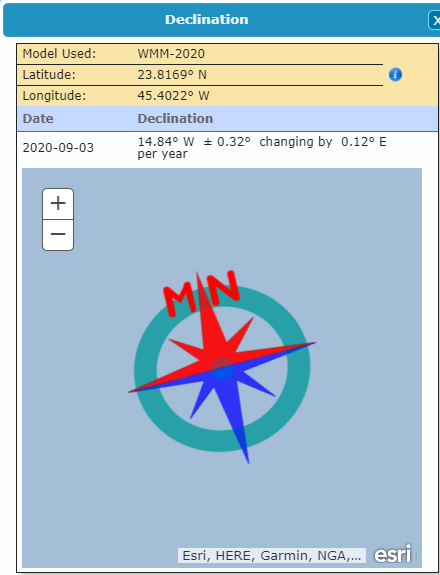

# Dado - Bruto

In [21]:
%matplotlib inline
HistDir(vel_bndo['Velocidade de Corrente [cm/s]'].astype(float)/100,vel_bndo['Direção de Corrente [Graus]'].astype(float),
        arqname='figuras/BNDO_ADCP',par='corrente',Pmax=0.8,interpolado=False,logo=False)


Figure Done



# Dado - Declinado

In [22]:
%matplotlib inline
HistDir(vel_bndo['Velocidade de Corrente [cm/s]'].astype(float)/100,vel_bndo['Direção de Corrente [Graus]'].astype(float)-14.84,
        arqname='figuras/BNDO_ADCP_DECLIN',par='corrente',Pmax=0.8,interpolado=False,logo=False)

Figure Done



# Modelo

In [23]:
bndo_mod_adcp['vel'] = ((bndo_mod_adcp['x component of horizontal velocity (m/s) - BNDO_ADCP_V2 - layer 1'])**2 + 
                         (bndo_mod_adcp['y component of horizontal velocity (m/s) - BNDO_ADCP_V2 - layer 1'])**2)**0.5

bndo_mod_adcp['dir'] = np.degrees(np.arctan2(bndo_mod_adcp['x component of horizontal velocity (m/s) - BNDO_ADCP_V2 - layer 1'], 
                        bndo_mod_adcp['y component of horizontal velocity (m/s) - BNDO_ADCP_V2 - layer 1']))

HistDir(bndo_mod_adcp.vel,bndo_mod_adcp.dir,
        arqname='figuras/MOD_ADCP',par='corrente',Pmax=0.8,interpolado=False,logo=False)

Figure Done



# TEMPERATURA E SALINIDADE

Nota-se que para temperatura, o modelo e o dado são mutio similares. Não tanto para o fundo, visto que é muito dificil representar a estrutura termohalina no Canal.

Para Salinidade, o modelo mostra que é mais salino que o dado. Isto provavelmente deve-se ao fato de que não coloquei inputs de água doce nem de pluviosidade.

In [24]:
#Lendo modelo
bndo_temp_adcp = pd.read_csv('Rc_final/RC_BAROC2_BNDO_ACDP2_TEMP.csv',encoding='latin1')
bndo_temp_adcp.index = pd.to_datetime(bndo_temp_adcp.iloc[:,0])
bndo_temp_adcp = bndo_temp_adcp.reindex(tt.index).interpolate()

bndo_sal_adcp = pd.read_csv('Rc_final/RC_BAROC2_BNDO_ACDP2_SAL.csv')
bndo_sal_adcp.index = pd.to_datetime(bndo_sal_adcp.iloc[:,0])
bndo_sal_adcp = bndo_sal_adcp.reindex(ss.index).interpolate()

<IPython.core.display.Javascript object>


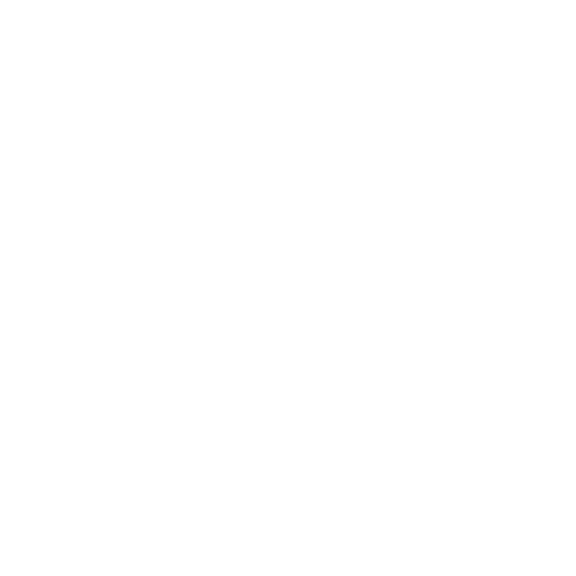

<IPython.core.display.Javascript object>


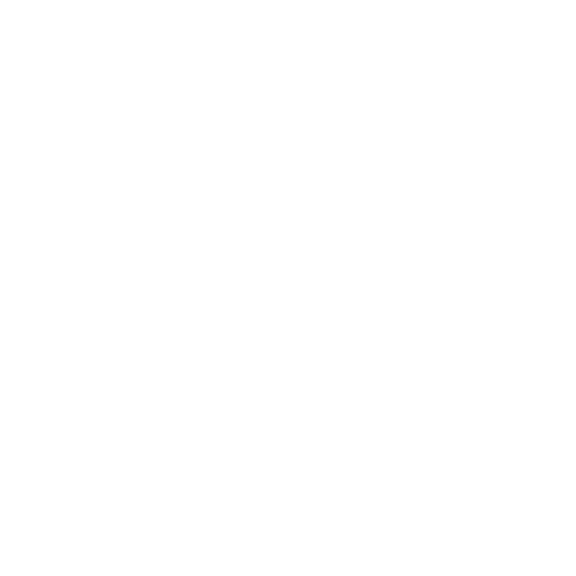

<IPython.core.display.Javascript object>


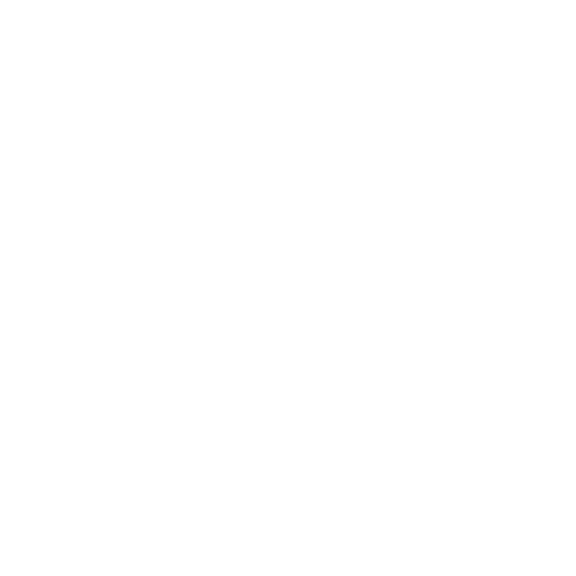

<IPython.core.display.Javascript object>


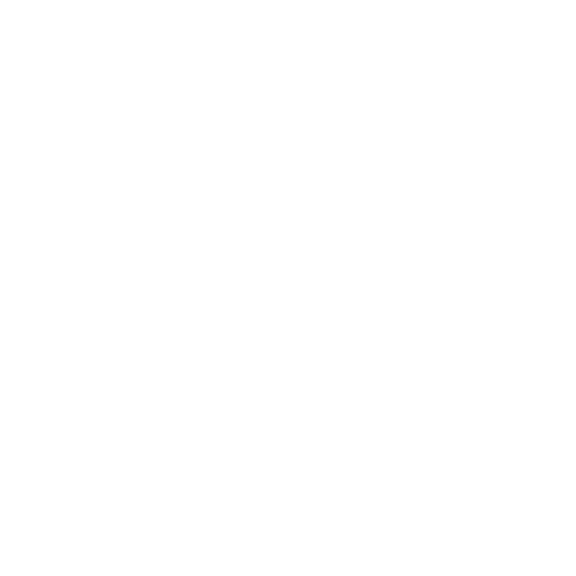

In [25]:
#Tratando e plotando
%matplotlib notebook

t0 = tt[tt['Profundidade [m]'] ==0]['Temperatura [°C]'].astype(float)
t1 = tt[tt['Profundidade [m]'] !=0]['Temperatura [°C]'].astype(float)

s0 = ss[ss['Profundidade [m]'] ==0]['Salinidade [PSU]'].astype(float)
s1 = ss[ss['Profundidade [m]'] !=0]['Salinidade [PSU]'].astype(float)


#TEMPERATURA
ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)

t0.plot(ax=ax[1][0],label= 'Dado')
t1.plot(ax=ax[1][1],label ='Dado')

bndo_temp_adcp.iloc[:,1].plot(ax=ax[1][0],label= 'Modelo')
bndo_temp_adcp.iloc[:,8].plot(ax=ax[1][1],label= 'Modelo')

ax[1][0].set_ylabel('Temperatura (°C)')
ax[1][1].set_ylabel('Temperatura (°C)')

ax[1][0].set_title('Superfície')
ax[1][1].set_title('Fundo')

plt.legend()

plt.savefig('figuras/Valid_TEMP_BNDO_araca.png',dpi=300,bbox='tight')

#SALINIDADE
ax = plt.subplots(figsize = (10,10),nrows=2,sharex=True)

s0.plot(ax=ax[1][0],label= 'Dado')
s1.plot(ax=ax[1][1],label ='Dado')

bndo_sal_adcp.iloc[:,1].plot(ax=ax[1][0],label= 'Modelo')
bndo_sal_adcp.iloc[:,8].plot(ax=ax[1][1],label= 'Modelo')

ax[1][0].set_ylabel('Salinidade (PSU)')
ax[1][1].set_ylabel('Salinidade (PSU)')

ax[1][0].set_title('Superfície')
ax[1][1].set_title('Fundo')

plt.legend()

plt.savefig('figuras/Valid_SAL_BNDO_araca.png',dpi=300,bbox='tight')

# Temperatura do modelo em outros Pontos de interesse no modelo

Aqui são algumas figuras para demonstrar a evolução temporal do modelo para outros pontos sem ser no Canal de São Sebastião.

Nas estações mais costeiras, a coluna tende a ser homogenea na maior parte do tempo. No entando, nas estações mais afastadas, observa-se a estratificação marcada quase que na maior parte do tempo. Ao final do período de modelagem é possível ver as temperaturas convergindo nestas estações, indicando o padrão esperado para a estação de inverno na plataforma.

A seguir, alguns dos pontos de monitoramento considerados. Nesta figura existem tanto pontos de coleta da CETESB, para qualidade da água costera, quanto outros dados do BNDO. 

A linha em preto, indica os limites da grade.

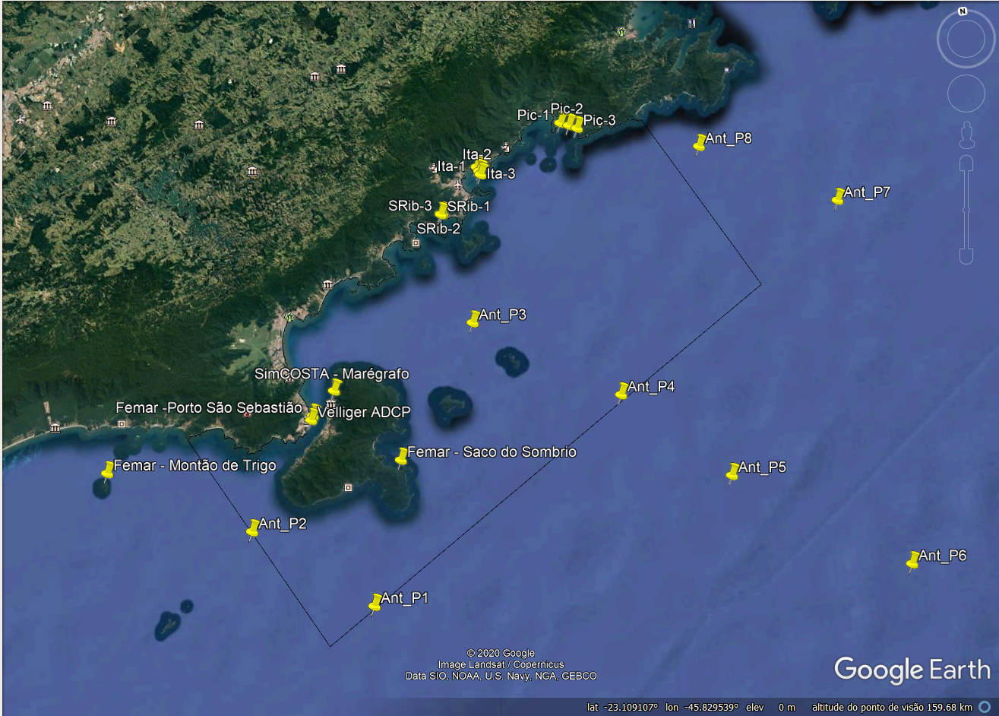


<IPython.core.display.Javascript object>


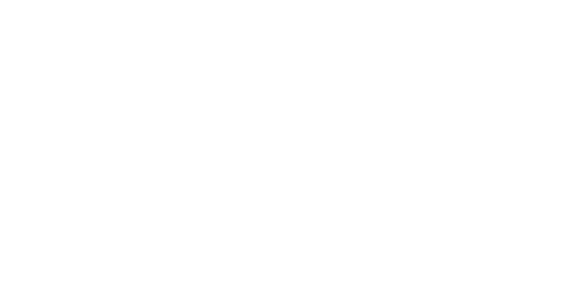

<IPython.core.display.Javascript object>


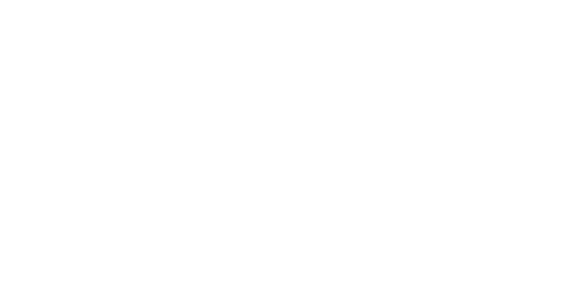

<IPython.core.display.Javascript object>


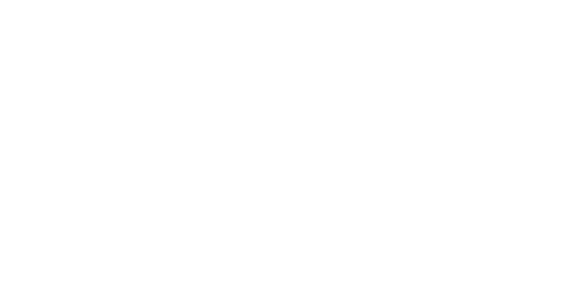

<IPython.core.display.Javascript object>


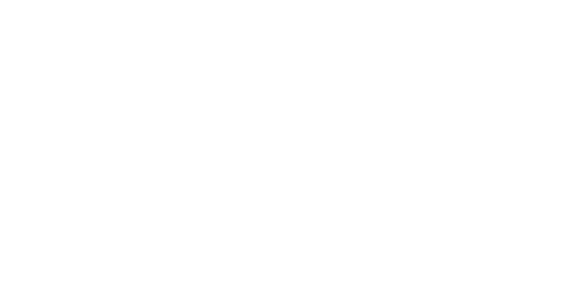

<IPython.core.display.Javascript object>


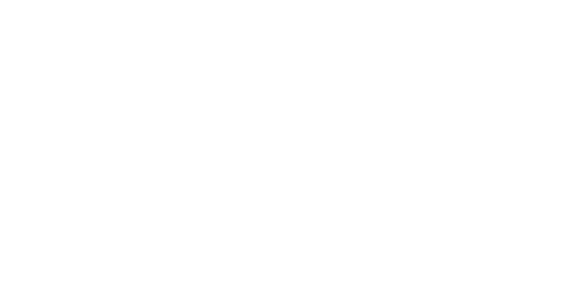

<IPython.core.display.Javascript object>


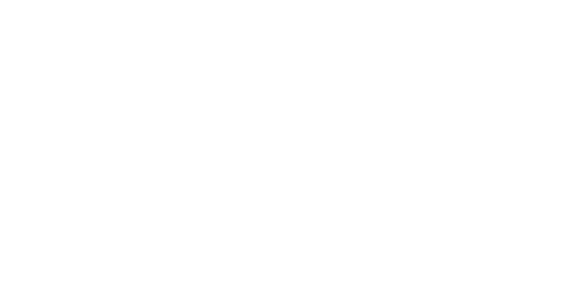

<IPython.core.display.Javascript object>


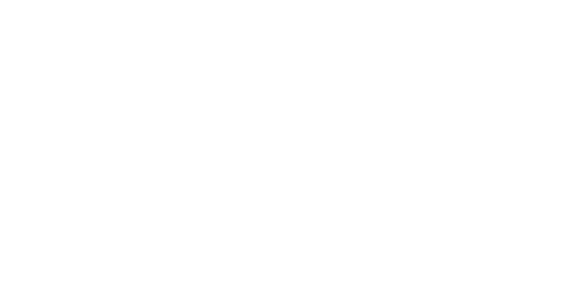

<IPython.core.display.Javascript object>


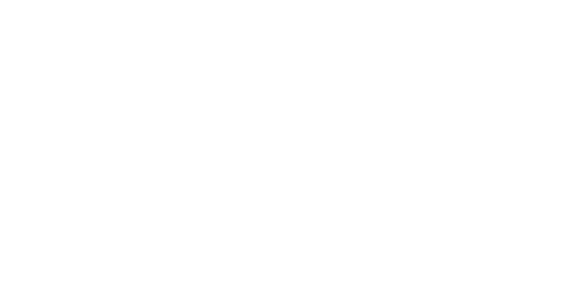

<IPython.core.display.Javascript object>


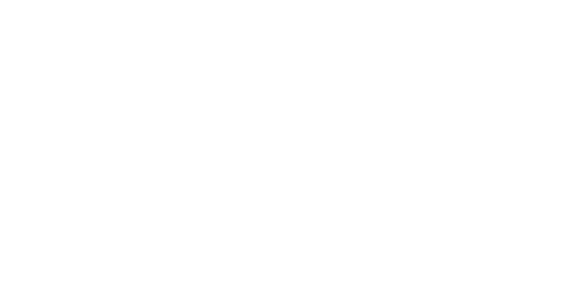

<IPython.core.display.Javascript object>


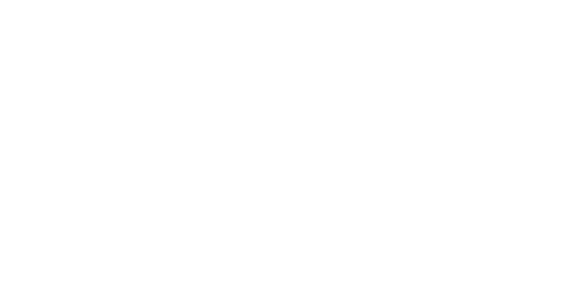

<IPython.core.display.Javascript object>


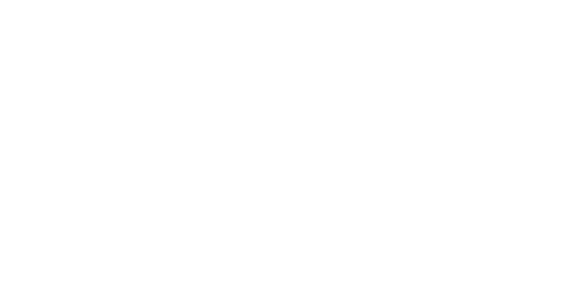

<IPython.core.display.Javascript object>


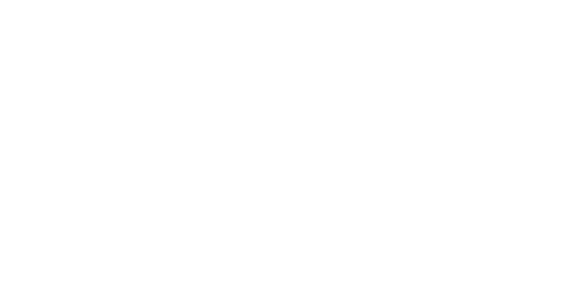

<IPython.core.display.Javascript object>


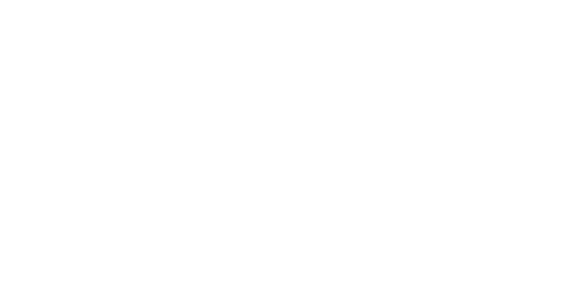

<IPython.core.display.Javascript object>


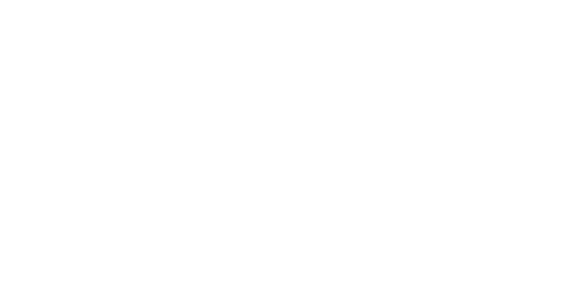

<IPython.core.display.Javascript object>


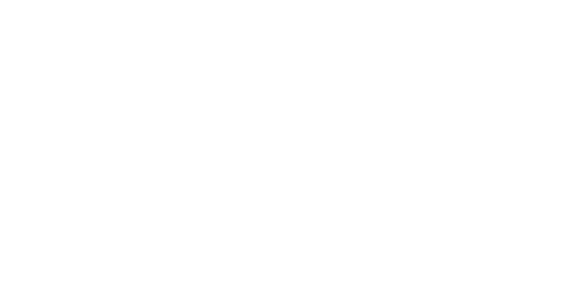

<IPython.core.display.Javascript object>


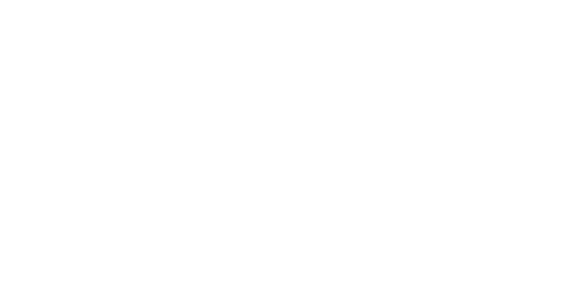

<IPython.core.display.Javascript object>


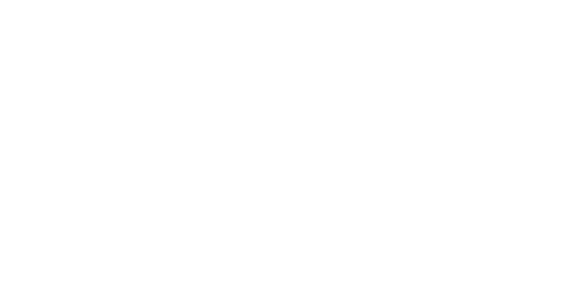

<IPython.core.display.Javascript object>


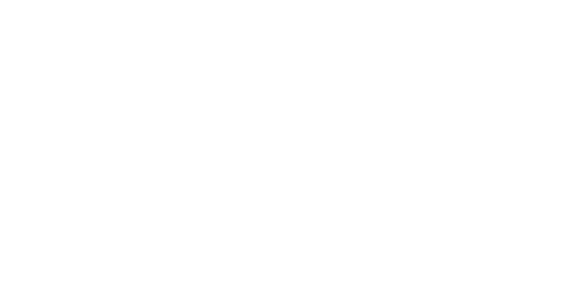

<IPython.core.display.Javascript object>


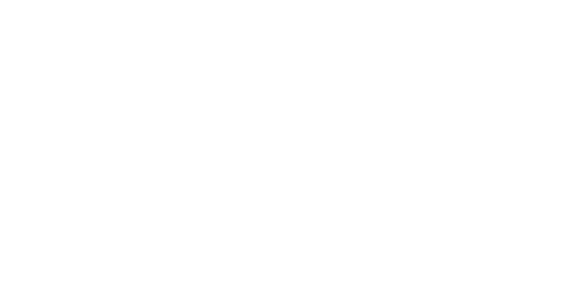

<IPython.core.display.Javascript object>


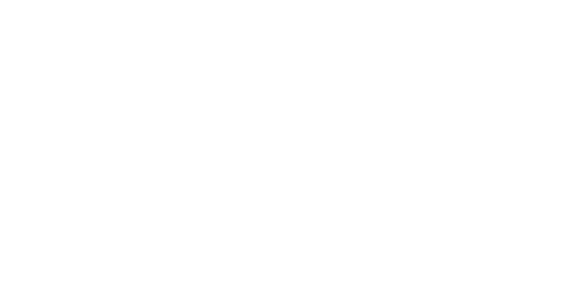

<IPython.core.display.Javascript object>


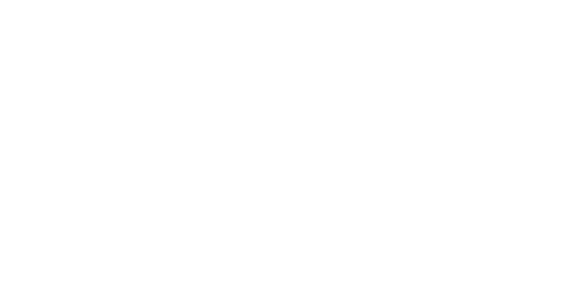

<IPython.core.display.Javascript object>


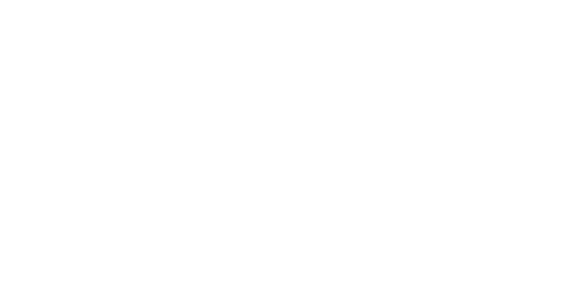

<IPython.core.display.Javascript object>


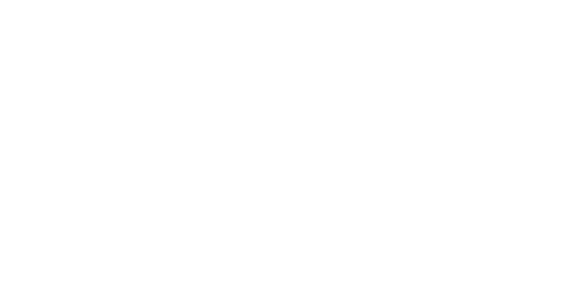

<IPython.core.display.Javascript object>


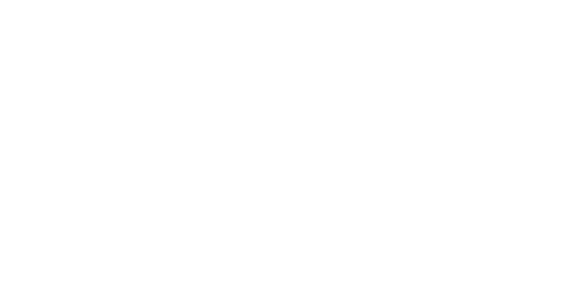

<IPython.core.display.Javascript object>


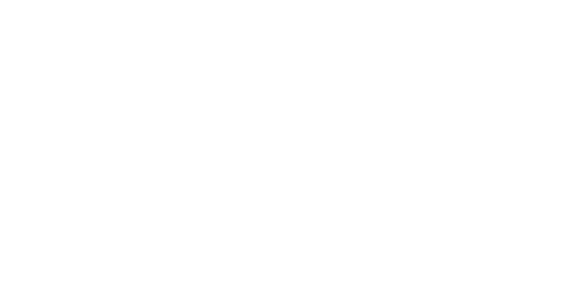

<IPython.core.display.Javascript object>


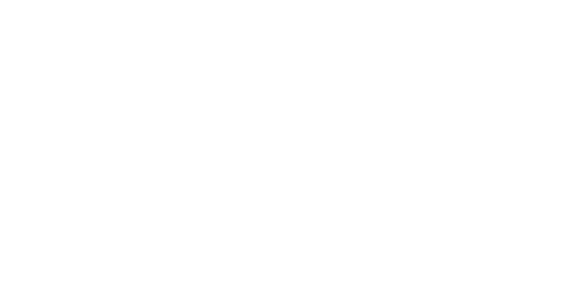

<IPython.core.display.Javascript object>


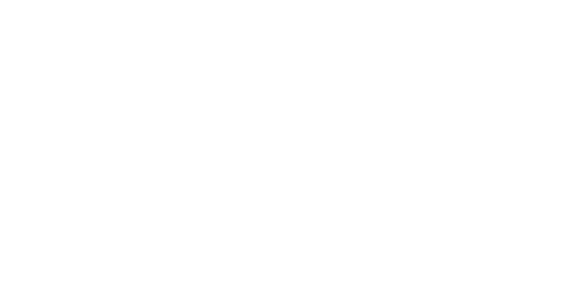

<IPython.core.display.Javascript object>


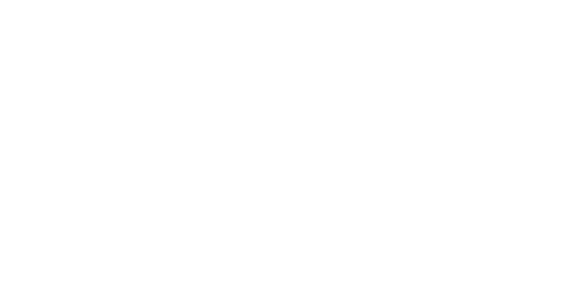

In [26]:
from glob import glob

estac_temp = glob('Rc_final/*TEMP*')

for estac in estac_temp:

    temp = pd.read_csv(estac,encoding='latin1')
    temp.index = pd.to_datetime(temp.iloc[:,0])
    
    plt.figure(figsize=(10,5))
    
    temp.iloc[:,1].plot(color = 'r', label= 'Superfície - SIGMA 1')
    temp.iloc[:,8].plot(color = 'cornflowerblue', label= 'Fundo - SIGMA 8 ')
    
    plt.xlabel('')
    plt.ylabel('Temperatura (°C)')
    
    #plt.title('Temperatura no Ponto {}'.format(estac.split('.')[0].split('\\')[1]))
    
    plt.legend()
    
    plt.savefig('figuras/ts/{}.png'.format(estac.split('.')[0].split('\\')[1]),dpi=300,bbox='tight')
    



# Análise das Forçantes do CFSR e Considerações com o Modelo

# VENTOS

In [27]:
rec = wnd.sel(lat=-23.78,lon = -45.399,method='nearest')
df = rec.to_dataframe()

# Stickplot

No Stickplot fica evidente o mesmo padrão notado nas correntes. A partir do meio de março, ocorre uma intensificação dos ventos com mudança na direção, provavelmente indicando entradas de frente no período simulado

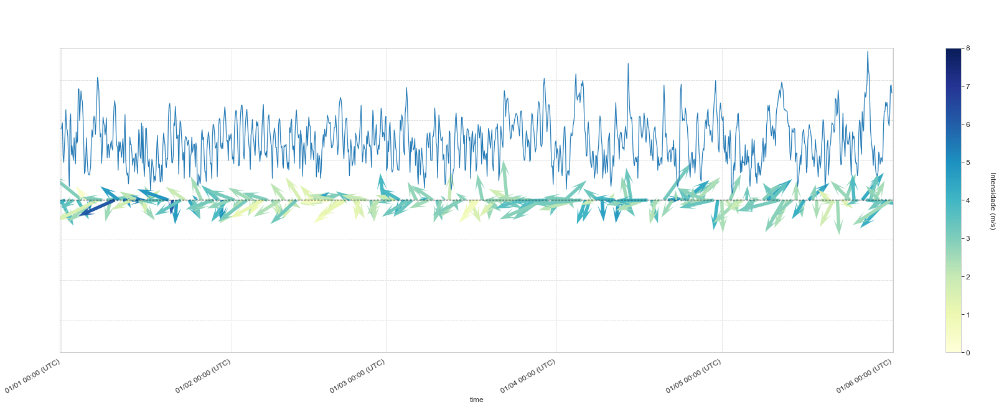

In [28]:
%matplotlib inline
cmap = plt.cm.YlGnBu

means = df.groupby(pd.Grouper(freq='3H')).mean()

stickplot(means.index,6,0,-1,means['U_GRD_L103'],means['V_GRD_L103'],df.vel.values)
means.vel.plot()

plt.savefig('figuras/CFS_wind_stick_SSeba.png',dpi=300,bbox='tight')


# Figura da Relação do Vento com o Dado e Modelo

<IPython.core.display.Javascript object>


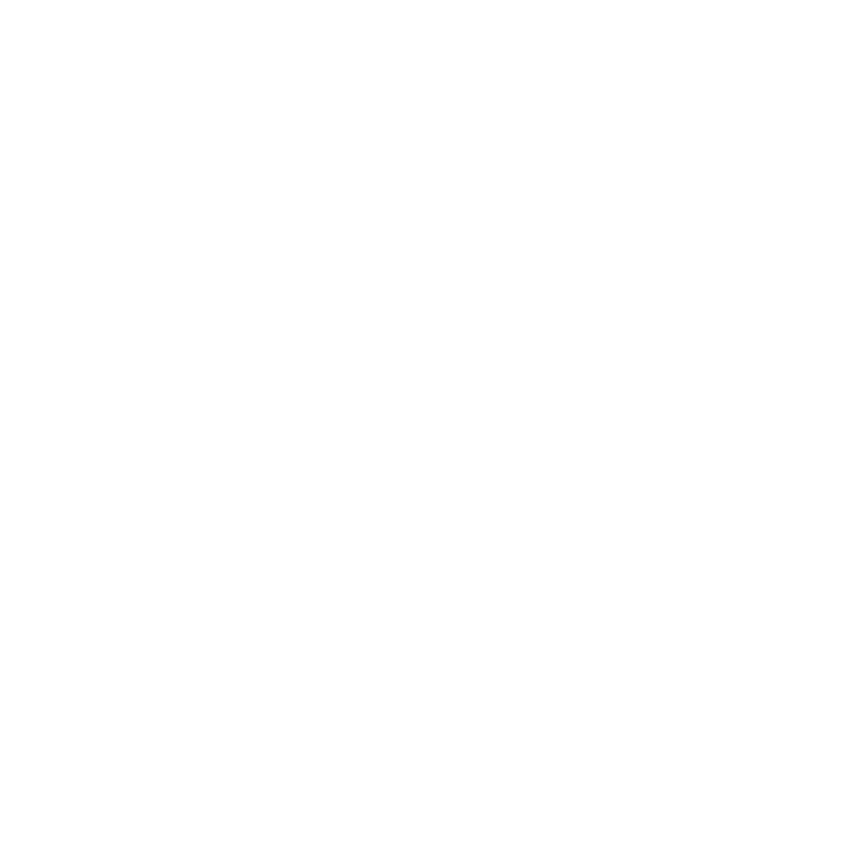

<IPython.core.display.Javascript object>


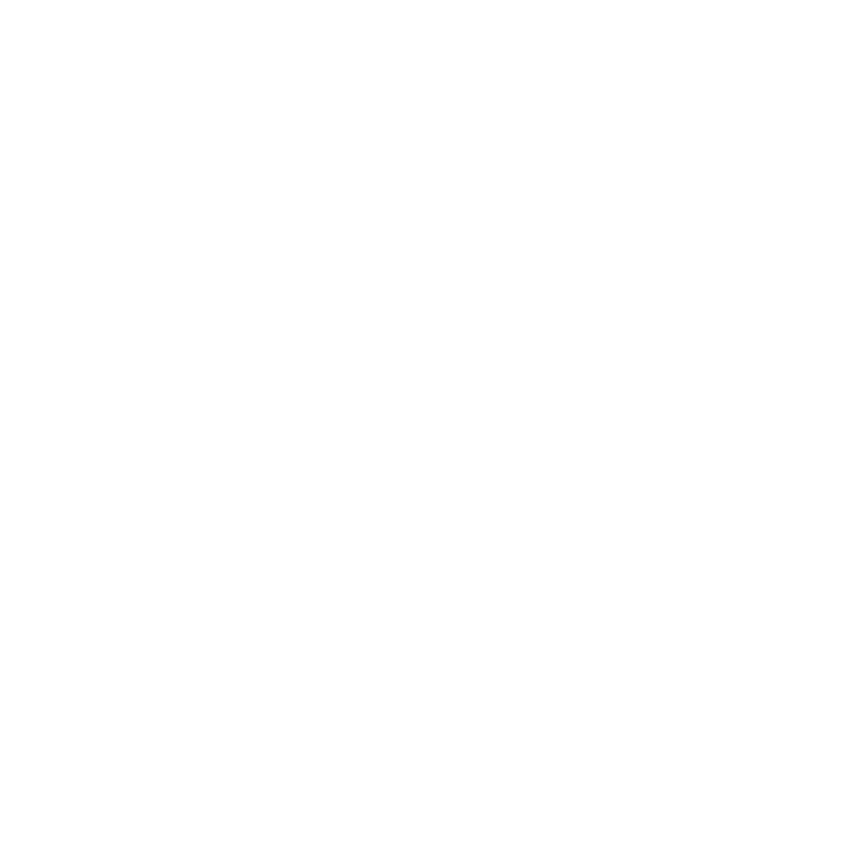

In [29]:
%matplotlib notebook
ax = plt.subplots(figsize = (15,15),nrows=2,sharex=True)  

ax_u = ax[1][0].twinx()
ax_v = ax[1][1].twinx()

means['U_GRD_L103'].plot(ax=ax_u,color='r',secondary_y=True,label='Vento CFS',linewidth=1.5)
plt.grid(False)
plt.ylabel('Intensidade do Vento (m/s)')
means['V_GRD_L103'].plot(ax=ax_v,color='r',secondary_y=True,label='Vento CFS',linewidth=1.5)
plt.grid(False)
plt.ylabel('Intensidade do Vento (m/s)')

u = bndo_mod_adcp.iloc[:,1]
v = bndo_mod_adcp.iloc[:,2]

u = passa_baixa(u,16)
v = passa_baixa(u,16)

vel_bndo.u.plot(ax=ax[1][0],label='Dado',color='k', linestyle=':')
vel_bndo.v.plot(ax=ax[1][1],label='Dado',color='k', linestyle=':')

u.plot(ax=ax[1][0],label = 'Modelo', linestyle=':',linewidth=1.2)
v.plot(ax=ax[1][1],label = 'Modelo', linestyle=':',linewidth=1.2)


ax[1][0].set_ylabel('Corrente (m/s)')
ax[1][1].set_ylabel('Corrente (m/s)')




ax[1][1].legend([ax[1][1].get_lines()[0], ax[1][1].get_lines()[0], ax_v.right_ax.get_lines()[0]],\
                ['Dado BNDO ADCP','Modelo Hidrodinâmico','Ventos CFS'])

ax[1][0].grid(False)
ax[1][1].grid(False)

ax_u.grid(False)
ax_v.grid(False)

ax[1][1].set_xlabel('')

plt.savefig('figuras/Vento_DADO_MODELO_araca.png',dpi=300,bbox='tight')

# Espectro de Frequências Vento

No espectro de frequência dos ventos, observa-se o padrão de baixas frequências vistos no nível do modelo, corroborando o fato de que muito provavelmente o vento é o responsável por considerável efeito na elevação e velocidade da corrente no modelo, assim como descrito na literatura

<IPython.core.display.Javascript object>


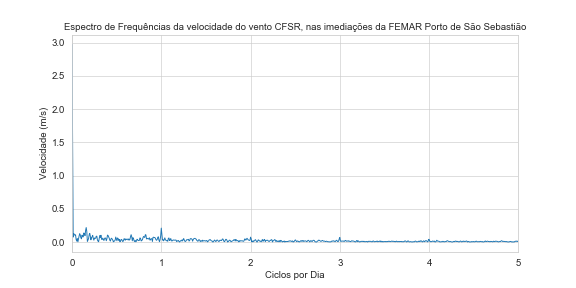

(0, 5)

In [30]:
%matplotlib notebook

plt.figure(figsize=(10,5))

plt.magnitude_spectrum(rec.vel, Fs=Fs)
plt.title('Espectro de Frequências da velocidade do vento CFSR, nas imediações da FEMAR Porto de São Sebastião')
plt.ylabel('Velocidade (m/s)')
plt.xlabel('Ciclos por Dia')

plt.xlim(0,5)

# Mapa Instântaneo dos Ventos

<IPython.core.display.Javascript object>


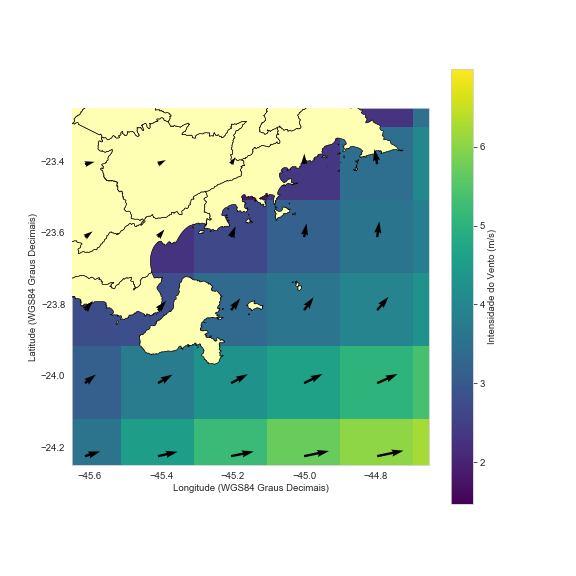

<IPython.core.display.Javascript object>


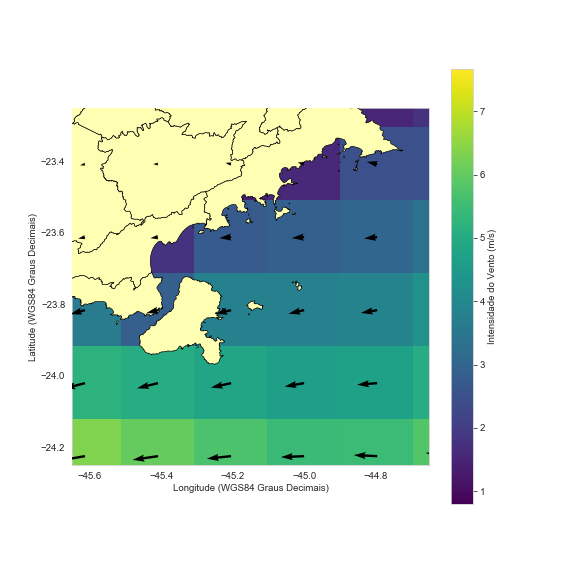

In [31]:
#Frente Fria - 08/05/2014
dia = wnd.sel(time='2014-05-08')

ax = sp.plot(figsize=(10,10),facecolor='#FFFFB3',edgecolor='k',zorder=100)

xx,yy = np.meshgrid(dia.lon.values,dia.lat.values)

ax.quiver(xx,yy,dia.U_GRD_L103.values[14],dia.V_GRD_L103.values[14],zorder=1000)

dia.isel(time=14).vel.plot(ax=ax,cbar_kwargs={'label': 'Intensidade do Vento (m/s)'})


plt.xlim(-45.65,-44.65)
plt.ylim(-24.25,-23.25)

plt.xlabel('Longitude (WGS84 Graus Decimais)')
plt.ylabel('Latitude (WGS84 Graus Decimais)')

plt.title('')

plt.savefig('figuras/Vento_CFS_08_05_2014.png',dpi=300,bbox='tight')

#----------------------------------------------------------------------------------------------------#

#Alta Subtropical - 19/02/2014
dia = wnd.sel(time='2014-02-19')

ax = sp.plot(figsize=(10,10),facecolor='#FFFFB3',edgecolor='k',zorder=100)

xx,yy = np.meshgrid(dia.lon.values,dia.lat.values)

ax.quiver(xx,yy,dia.U_GRD_L103.values[2],dia.V_GRD_L103.values[2],zorder=1000)

dia.isel(time=2).vel.plot(ax=ax,cbar_kwargs={'label': 'Intensidade do Vento (m/s)'})


plt.xlim(-45.65,-44.65)
plt.ylim(-24.25,-23.25)

plt.xlabel('Longitude (WGS84 Graus Decimais)')
plt.ylabel('Latitude (WGS84 Graus Decimais)')

plt.title('')

plt.savefig('figuras/Vento_CFS_19_02_2014.png',dpi=300,bbox='tight')

# Temperatura do Ar e Radiação de Onda Curta Incidente

Nestes gráficos fica claro como a temperatura do modelo responde a forçante atmosférica, mesmo com inputs de temperatuar e salinidade do HYCOM nas bordas. Tambéms demonstra a relaçõa com a readiação de onda curta que incide na região. 

Estes efeitos mostram que o modelo realiza trocas de calor com as forçantes, mantendo um padrão esperado pelo que é forçado nele mesmo.

<IPython.core.display.Javascript object>


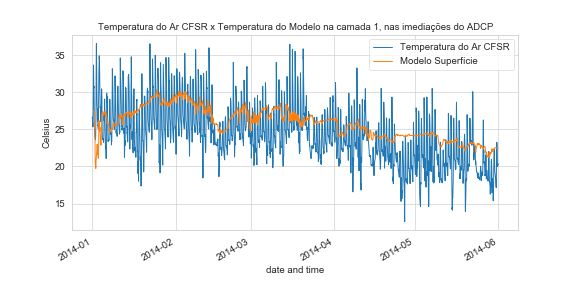

<IPython.core.display.Javascript object>


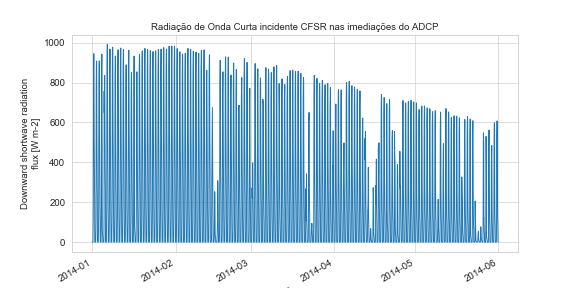

Text(0.5, 1.0, 'Radiação de Onda Curta incidente CFSR nas imediações do ADCP')

In [32]:
bndo_temp_adcp = pd.read_csv('Rc_final/RC_BAROC2_BNDO_ACDP2_TEMP.csv',encoding='latin1')
bndo_temp_adcp.index = pd.to_datetime(bndo_temp_adcp.iloc[:,0])

plt.figure(figsize=(10,5))
temp_ar.sel(lat=-23.78,lon = -45.399,method='nearest').Celsius.plot(label='Temperatura do Ar CFSR')
bndo_temp_adcp.iloc[:,1].plot(label='Modelo Superfície')

plt.title('Temperatura do Ar CFSR x Temperatura do Modelo na camada 1, nas imediações do ADCP')

plt.legend()


plt.figure(figsize=(10,5))
rad.sel(lat=-23.78,lon = -45.399,method='nearest').DSWRF_L1_Avg_1.plot()

plt.title('Radiação de Onda Curta incidente CFSR nas imediações do ADCP')